<a href="https://colab.research.google.com/github/kevinroccapriore/Multichannel-rVAE/blob/main/Multilchannel_rVAE_EELS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mulitchannel rotationally-invariant variational autoencoder (rVAE) for 3D EELS
* Notebook created by **Kevin Roccapriore**


* **Kevin Roccapriore** and **Andrew Lupini** collected the STEM-EELS data on Nion microscopes
* **Abhay Singh** and **Usha Philipose** electrochemically synthesized the nanowire samples (for low loss EELS)
* **Maxim Ziatdinov** developed the rVAE algorithms for use with scientific hyperspectral data
* **Sergei Kalinin** organized and oversaw the project, and helped develop the multichannel 

___
* Originally created notebook `11.05.2020`
* Last update: `09.03.2021`

<font size = 5><u>Notes</u><font>
* Here we explore the multichannel rVAE algorithm applied to STEM-EELS data, with the intent to discover spatially invariant features. The EELS data are collected as 3D data cubes, where the first two dimensions are space (x,y) and the 3rd dimension is energy (E), collectively called a "spectrum image."

* The traditional feature extraction tools - e.g., principle component analysis (PCA), non-negative matrix factorization (NMF) - do not consider the spatial correlations within the data. In other words, the spatial coordinates in the 3D data cube are not taken into account - the 3D data is flattened into 2D: one dimension of space and one dimension of energy.

* Strangely, the NWs display what appear to be typical nanowire plasmon modes despite the fact that they are not (intentionally) doped with any additional free carriers. This may be due to higher concentration of In than Sb, for example, so that the stoichiometric ratio is not 1:1. Just speculation though.

* Band gap is supposed to be ~0.17 eV (some FTIR results show this), but difficult to see with the low energy plasmons near this region.

* These modes of course depend on nanowire length and in general their geometry (as well as composition, etc) but here we detect features down to the NIR up to the deep UV, i.e., sharply peaked spectral features occur across a wide spectral range.

<u><font size = 5>Sample Details</font></u>

**Preparation**:

* <u>InSb nanowires</u>

  Electrochemical synthesis in porous anodic aluminum oxide (AAO) templates. Potentiostatic growth at -1.5 V. Post growth the wires are dissolved in NaOH to remove the template, then are ultrasonically cleaned in DI water.

**STEM-EELS**:

* STEM-EELS was performed at 60 kV with a probe current of ~50 pA. If monochromated, the FWHM of the zero loss peak was around 40 meV after monochromation, otherwise around 300 meV. Pixel dwell times for spectrum images were 75-100 ms.

**Data processing**:

* The hyperspectral EELS datasets have had their zero loss peak fit and removed by a power law. Only (x,y) pixels receiving greater than 5000 counts in any energy channel were used in the fitting - if less than 5000 it means signal is too low for fitting a power law properly. This occurs in regions that are too thick for the electron beam.

**Analysis**:

* Multichannel rVAE is performed and compared to traditional linear (and nonlinear) algorithms which ignore spatial correlations, e.g., PCA, NMF, and 1D VAE.

In [ ]:
#@title Import modules
%%capture
from scipy.ndimage import gaussian_filter
import glob
import os
from typing import List, Tuple, Type
import numpy as np
import matplotlib.pyplot as plt
import json
import matplotlib.gridspec as gridspec
from scipy import ndimage
from scipy import signal
import operator
from scipy import interpolate
import matplotlib.patches as patches
from google.colab import files
from scipy import interpolate

# Basic ML modules
from sklearn.decomposition import NMF
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import mixture
from sklearn import decomposition
from sklearn.metrics import mean_squared_error as MSE

from pylab import *
import cv2
from skimage import io
import pandas as pd
import seaborn as sns

# !pip install -q git+https://github.com/ziatdinovmax/atomai@maxdev --upgrade
!pip install git+https://github.com/ziatdinovmax/atomai.git 
import atomai as aoi

In [ ]:
#@title Helper functions
def MakeCompositeImage(ims,colors):
    """
    Adds and averages different maps to form a composite map
    
    Input:  ims    - list of images of same dimension (numpy array)
            colors - a list of colors in rgb format (triple of fractional values)
            labels - labels for the different images (tuple of strings)
    Output: out_im - Composite image (RGB image)
    """
    ims=np.asarray(ims)
    dims=ims.shape
    print(dims)
    out_im=np.zeros(dims[1:]+(3,))
    for i in range(dims[1]):
      for j in range(dims[2]):
        out_im[i,j]=np.sum([v*np.asarray(c) for v,c in zip(ims[:,i,j],colors)],axis=0)/np.sum(ims[:,i,j])
    return out_im
    
def LoadADF(filename):
    ADF1    = np.load(filename)
    ADF1j = json.load(open(filename[:-3]+'json','r'))
    ADF1_scale = ADF1j['spatial_calibrations'][0]['scale']
    return ADF1, ADF1_scale

def OrganizeInput2(numpy):
    SIraw = np.load(numpy)
    XY = SIraw.shape[:2]
    SIj = json.load(open(numpy[:-3]+'json','r'))
    disp = SIj['spatial_calibrations'][2]['scale']
    SIraw_flat=SIraw.reshape((np.prod(XY),SIraw.shape[2]))
    E_offset = SIj['spatial_calibrations'][2]['offset']
    E = np.linspace(E_offset,SIraw.shape[2]*disp+E_offset,SIraw.shape[2])
    return SIraw, XY, disp, SIraw_flat, E

def CalibrateSI2(EAx,SI,num_spectral_px):
    m,M = np.amax(np.amin(EAx)), np.amin(np.amax(EAx))
    try:
      Eout=np.linspace(m,M,num_spectral_px)[1:]
      Eout=np.linspace(m,M,num_spectral_px,endpoint=True)
    except ValueError:
      Eout=np.linspace(m,M,5000)[1:]
      Eout=np.linspace(m,M,5000,endpoint=True)
    SIout=np.array([[interpolate.interp1d(e,s)(Eout) for e,s in zip(erow,srow)] for erow,srow in zip(EAx,SI)])
    return Eout,SIout

def CalibrateEnergyAxis2(SInc, EAx):
  '''
  For coreloss signals we don't have a "known" peak to reference (like the ZLP)
  Therefore, each (x,y) pixel will have the same energy axis as one another.
  Here we just create an array with the same shape as input SI, where every row/column
  has the same energy axis.
  '''

  EnergyAxes = np.zeros((SInc.shape[0], SInc.shape[1], EAx.shape[0]))
  for row in range(EnergyAxes.shape[0]):
    for col in range(EnergyAxes.shape[1]):
        EnergyAxes[row,col] = EAx
  return EnergyAxes

def organize_data2(filename, num_spectral_px, plot = False):
  SIraw, XY, disp, SIraw_flat, EAx = OrganizeInput2(filename) 
  SInc = CorrectNeg(SIraw, Blur = 20, Neg = -20, Pixrange = 200, plot=plot)
  EnergyAxes=CalibrateEnergyAxis2(SInc,EAx)
  E,SI=CalibrateSI2(EnergyAxes,SInc, num_spectral_px)                # calibrate energies by making all pixels start and end at same energy values
  SIflat=SI.reshape((np.prod(XY),SI.shape[2]))  

  return E, SI, XY, SIflat

def FitPowerlaw_v2(E,S,fst,fen):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    #e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    fig=plt.figure(figsize=(20,3))
    
    ax=fig.add_subplot(131)
    
    plt.plot(E,S,color='k',label='Data')
    plt.plot(E[ist:ien],S[ist:ien],marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
    plt.legend(frameon=False,fontsize=13)
    fite=np.linspace(E[ist+1],E[ien-1],1000)
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    # plt.ylim(0,0.002)
    r,A0=np.polyfit(elog,slog,1)
    
    ax=fig.add_subplot(132)
    
    plt.plot(E[ist:],S[ist:],color='k',label='Data')
    plt.plot(E[ist:],np.exp(A0)*E[ist:]**(r),'b',lw=3,label='Power Law Fit')
    plt.tick_params(labelsize=16)
    plt.legend(frameon=False,fontsize=13)
    
    ax=fig.add_subplot(133)
    
    plt.axhline(0,color='k')
    plt.plot(E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),color='b',label='Powerlaw Subtraction')
    plt.tick_params(labelsize=16)
    ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
    plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
    plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    # plt.ylim(-0.0001,0.001)
    fit_spec = np.exp(A0)*E[ist:]**(r)
    # return fite,0.#,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d)
    return fit_spec

def organize_data(filename, num_spectral_px, plot = False):
  SIraw, XY, disp, SIraw_flat = OrganizeInput(filename) 
  SInc = CorrectNeg(SIraw, Blur = 20, Neg = -20, Pixrange = 200, plot = plot)
  SIncflat = SInc.reshape((np.prod(XY),SInc.shape[2]))
  EnergyAxes=CalibrateEnergyAxis(SInc,disp)                  # align ZLP & use dispersion to go from pixel -> eV
  Eaxflat=EnergyAxes.reshape((np.prod(XY),SInc.shape[2]))    # flatten
  E,SI=CalibrateSI(EnergyAxes,SInc, num_spectral_px)                # calibrate energies by making all pixels start and end at same energy values
  SIflat=SI.reshape((np.prod(XY),SI.shape[2]))  
  return E, SI, XY, SIflat

def truncate_spectrum(ENB, cutoffenergy):
  truncate = (np.abs(ENB-cutoffenergy)).argmin()
  return truncate 

def OrganizeInput(numpy):
    SIraw = np.load(numpy)
    XY = SIraw.shape[:2]
    SIj = json.load(open(numpy[:-3]+'json','r'))
    disp = SIj['spatial_calibrations'][2]['scale']
    SIraw_flat=SIraw.reshape((np.prod(XY),SIraw.shape[2]))
    return SIraw, XY, disp, SIraw_flat
    
def LoadADF(filename):
    ADF1    = np.load(filename)
    ADF1j = json.load(open(filename[:-3]+'json','r'))
    ADF1_scale = ADF1j['spatial_calibrations'][0]['scale']
    return ADF1, ADF1_scale

def BlurSpectra_single(SIraw, sigma = 10):
    SIraw_blur_single = ndimage.filters.gaussian_filter(SIraw, sigma = sigma)
    return SIraw_blur_single

def BlurSpectra(SIraw, sigma = 10):
    SIraw_blur = np.zeros((SIraw.shape[0],SIraw.shape[1],SIraw.shape[2]))
    for i in range(SIraw.shape[0]):
        for j in range(SIraw.shape[1]):
            SIraw_blur[i,j] = ndimage.filters.gaussian_filter(SIraw[i,j,:], sigma = sigma)
    return SIraw_blur

def BlurSpectra_flat(SI, sigma = 10):
    SI_blur = np.zeros_like(SI)
    for ii in range(SI_blur.shape[0]):
        SI_blur[ii] = ndimage.filters.gaussian_filter(SI[i,:], sigma = sigma)
    return SI_blur

def CorrectNeg(SIraw, Blur = 10, Neg = -20, Pixrange = 250, plot = True):
    """
    Args:
       SI = Accepts any 3-dim SI as the operated-on SI, normally raw
       Blur =   gaussian blur sigma value. Should be set 10-30
                range to avoid false peaks due to noise
       Neg =    value which is considered to be negative. 
                Generally shouldn't be set to exactly 0 (or very close,
                like -1), due to noise effects
                **this also prevents spectra which are not negative at
                all from being artificially offset**
       Pixrange = number of pixels to average (centered around most 
                negative pixel located after blurring) over for sub-
                tracting from raw data
    Returns:
       - Original SI with offset
       - Blurred SI with offset
       - Plot of original + blurred offset 
    """  
    # blurs each pixels' spectrum
    SIraw_blur = np.zeros((SIraw.shape[0],SIraw.shape[1],SIraw.shape[2]))
    for i in range(SIraw.shape[0]):
        for j in range(SIraw.shape[1]):
            SIraw_blur[i,j] = ndimage.filters.gaussian_filter(SIraw[i,j,:], sigma = Blur)
    
    # local min peak search:
    # performs scipy findpeaks function (inverts signal to find MIN), then picks out most negative
    # again, should be OK due to the blurring previously
    # Derp, I think this could've been done much easier with np.min() and np.argmin()...
    # Actually maybe not, because I set a height parameter with findpeaks.
    
    MN = np.zeros((SIraw.shape[0],SIraw.shape[1]))
    posmaxpixel = np.zeros((SIraw.shape[0],SIraw.shape[1]))     
    for i in range(SIraw_blur.shape[0]):
        for j in range(SIraw_blur.shape[1]):
            if np.amax(SIraw[i,j])<5000:
                MN[i,j] = np.nan
            else:
                posmaxpixel[i,j]= np.argmax(SIraw_blur[i,j,:])
        
                peaks,props = signal.find_peaks(-1*SIraw_blur[i,j,int(posmaxpixel[i,j]):],height = -20)
                keys = peaks.tolist()
                values = props['peak_heights'].tolist()
                peakdict = dict(zip(keys, values))     
                sorted_peakdict = sorted(peakdict.items(), key=operator.itemgetter(1))
                mostneg = np.array(sorted_peakdict[-1:])
                mostnegT = mostneg.T
                try:
                    MN[i,j] = posmaxpixel[i,j]+mostnegT[0][0] # this is the most negative pixel, value that we need   
                except IndexError:
                    MN[i,j] = np.nan # if sample TOO THICK, spectrum is noise, so will produce index error; 
                                     # this just gives that the bird by setting to NaN.

      
            
    SInc =  np.zeros_like(SIraw)      
    SInegmean = np.zeros((SIraw.shape[0],SIraw.shape[1]))        
    for i in range(SIraw_blur.shape[0]):
         for j in range(SIraw_blur.shape[1]):
            if np.isnan(MN[i,j]) == True:     # handling if sample too thick
                SInc[i,j] = SIraw[i,j]
            elif np.isnan(MN[i,j]) == False:
                SInegmean[i,j] = np.mean(SIraw_blur[i,j,int(MN[i,j]-Pixrange/2):int(MN[i,j]+Pixrange/2)])
                SInc[i,j] = SIraw[i,j] - SInegmean[i,j]
            
                
            
    # for plotting (finding scatter XY coordinates)
    if plot == True:

      x_pos, y_pos = np.zeros_like(MN), np.zeros_like(MN)
      for i in range(SIraw_blur.shape[0]):
          for j in range(SIraw_blur.shape[1]):
              if np.isnan(MN[i,j]) == True:
                  x_pos[i,j] = 0
                  y_pos[i,j] = 0
              else:
                  x_pos[i,j] = int(MN[i,j])
                  y_pos[i,j] = SIraw_blur[i,j,int(x_pos[i,j])]
      
      i,j = np.random.randint(SIraw.shape[0]), np.random.randint(SIraw.shape[1])
                                                                            
      fig = plt.figure(figsize=(16,4))
      gs = gridspec.GridSpec(1,2)
      ax1 = plt.subplot(gs[0,0])
      ax2 = plt.subplot(gs[0,1])
      
      ax1.plot(SIraw_blur[i,j,:])
      ax1.plot(SIraw[i,j], alpha = 0.5)
      ax1.set_ylim(-100,1000)
      ax1.axhline(0,color='k',ls='--',lw=1.5)
      
      if x_pos[i,j] == 0:
          ax1.annotate('No offset performed: \nCould not find negative enough value', xy = (0.5,0.7), xycoords = 'axes fraction')
      else:
          ax1.scatter(x_pos[i,j], y_pos[i,j], color = 'r')
          patch1 = patches.Rectangle((x_pos[i,j]-Pixrange/2, y_pos[i,j]-30), Pixrange, 60, linewidth = 1, edgecolor = 'red', facecolor = 'red', fill = False)
          ax1.add_patch(patch1)
      
      
      ax2.plot(SInc[i,j])
      ax2.set_ylim(-100,1000)
      ax2.axhline(0,color='k',ls='--',lw=1.5);
    
    # r'$\bf{fixed \ data}$
    
      ax1.set_title(r'$\bf{XY} = $' + r'$\bf[{},{}]$: Raw SI, blurred SI, region of averaging'.format(i,j))
      ax2.set_title(r'$\bf{XY} = $' + r'$\bf[{},{}]$: Corrected SI'.format(i,j))
    
    else:
      pass
    
    return SInc


def CalibrateEnergyAxis(SI,disp,style='fwhm',subfitwidth=8):
    Einit=np.arange(0,SI.shape[2])*disp
    if style=='pixel': ZLPC=np.array([[Einit[np.argmax(s)] for s in row] for row in SI])
    if style=='fwhm':
        lh,uh=[],[]
        avspec=np.average(SI,axis=(0,1))
        for row in SI:
            lh.append([]);uh.append([])
            for s in row:
                if np.amax(s)<1000: # This line is for thick samples when ZLP drops to noise levels
                    s=avspec
                lh[-1].append(Einit[np.argmin(np.abs(s[:np.argmax(s)]/np.amax(s)-0.5))])
                uh[-1].append(Einit[np.argmin(np.abs(s[np.argmax(s):]/np.amax(s)-0.5))+np.argmax(s)])
        lh=np.asarray(lh)        
        uh=np.asarray(uh)
        ZLPC=np.average([uh,lh],axis=0)
    if style=='subpixel':
        def gauss(x,a,x0,s): return a*np.exp(-(x-x0)**2/s**2)
        from scipy.optimize import curve_fit
        ZLPC=np.array([[curve_fit(gauss,Einit[np.argmax(s)-W:np.argmax(s)+W],
                               s[np.argmax(s)-W:np.argmax(s)+W]/np.amax(s))[0][1] for s in row] for row in SI])
    return np.array([[Einit-c for c in row] for row in ZLPC])
    
def CalibrateSI(EAx,SI,num_spectral_px):
    m,M = np.amax(np.amin(EAx,axis=(2))), np.amin(np.amax(EAx,axis=(2)))
    try:
      Eout=np.linspace(m,M,num_spectral_px)[1:]
      Eout=np.linspace(m,M,num_spectral_px,endpoint=True)
    except ValueError:
      Eout=np.linspace(m,M,5000)[1:]
      Eout=np.linspace(m,M,5000,endpoint=True)
    SIout=np.array([[interpolate.interp1d(e,s)(Eout) for e,s in zip(erow,srow)] for erow,srow in zip(EAx,SI)])
    return Eout,SIout


def FitPowerlaw(E,S,fst,fen, plot = True):

    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    #e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    if plot == True:
      fig=plt.figure(figsize=(20,3))
      ax=fig.add_subplot(131)
      plt.plot(E,S,color='k',label='Data')
      # plt.plot(E[ist:ien],S[ist:ien],marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
      plt.axvspan(E[ist],E[ien], color = 'r', alpha = 0.6, label = 'Fit Region')
      plt.legend(frameon=False,fontsize=13)
    else:
      pass
    fite=np.linspace(E[ist+1],E[ien-1],1000)
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    # plt.ylim(0,0.002)
    r,A0=np.polyfit(elog,slog,1)

    if plot == True:
      ax=fig.add_subplot(132)
      plt.plot(E[ist:],S[ist:],color='k',label='Data')
      plt.plot(E[ist:],np.exp(A0)*E[ist:]**(r),'b',lw=3,label='Power Law Fit')
      plt.tick_params(labelsize=16)
      plt.legend(frameon=False,fontsize=13)
    else:
      pass
    
    if plot == True:
      ax=fig.add_subplot(133)
      
      plt.axhline(0,color='k')
      plt.plot(E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),color='b',label='Powerlaw Subtraction')
      plt.tick_params(labelsize=16)
      ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
      plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
      plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    else:
      pass
    # plt.ylim(-0.0001,0.001)
    # return fite,0.#,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d)
    return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r)
    # return S[ist:]-np.exp(A0)*E[ist:]**(r)

def FitPowerlaw2R(E,S,fs1,fe1,fs2,fe2):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    fig=plt.figure(figsize=(20,3))
    
    ax=fig.add_subplot(131)
    
    plt.plot(E*1000,S,color='k',label='Data')
    plt.plot(e*1000,s,marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
    plt.legend(frameon=False,fontsize=13)
    fite=np.linspace(E[is1+1],E[ie2-1],300)
    f=interpolate.interp1d(E[is1:ie2],S[is1:ie2],kind='linear')
    nozeros=s[np.where(s>0)]
    nozeroe=e[np.where(s>0)]
    elog=np.log(nozeroe)
    slog=np.log(nozeros)
    plt.ylim(0,0.02)
    r,A0=np.polyfit(elog,slog,1)
    
    ax=fig.add_subplot(132)
    
    plt.plot(E[is1:]*1000,S[is1:],color='k',label='Data')
    plt.plot(E[is1:]*1000,np.exp(A0)*E[is1:]**(r),'b',label='Power Law Fit')
    plt.tick_params(labelsize=16)
    plt.legend(frameon=False,fontsize=13)
    
    ax=fig.add_subplot(133)
    
   # plt.plot(fite,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d),color='r',label='Exponential Subtraction')
    plt.plot(E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r),color='b',label='Powerlaw Subtraction')
    plt.tick_params(labelsize=16)
    ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
    plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
    plt.axhline(0,color='k')
    plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    
    plt.ylim(-0.0001,0.001)
    
    return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)


## background subtraction using either 1 region or 2 regions:

def RemoveBackgroundSI(E,S,fst,fen):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    if len(np.where(S[ist:ien]>0)[0]) == 0.: 
        plt.plot(E[ist:],S[ist:])
        return E[ist:],np.zeros(E[ist:].shape)
    r,A0=np.polyfit(elog,slog,1)
    return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),

def RemoveBackgroundSI_THICK(E,S,fst,fen, threshold = 5000):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    if len(np.where(S[ist:ien]>0)[0]) == 0.: 
        plt.plot(E[ist:],S[ist:])
        return E[ist:],np.zeros(E[ist:].shape)
    if np.max(S) > threshold:
      r,A0=np.polyfit(elog,slog,1)
      return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),
    else:
      print("Too thick, no fitting performed")
      return E[ist:],S[ist:]
  
def RemoveBackgroundSI2R(E,S,fs1,fe1,fs2,fe2):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    elog=np.log(e[np.where(s>0)])
    slog=np.log(s[np.where(s>0)])
    r,A0=np.polyfit(elog,slog,1)
    return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)

def RemoveBackgroundSI2R_THICK(E,S,fs1,fe1,fs2,fe2, threshold = 5000):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    if np.max(S)>threshold:
      elog=np.log(e[np.where(s>0)])
      slog=np.log(s[np.where(s>0)])
      try:
        r,A0=np.polyfit(elog,slog,1)
        return E[is1:],S[is1:] - np.exp(A0)*E[is1:]**(r)
      except TypeError:
        plt.plot(e, s)
      
    else:
      print('too thick? Consider adjusting threshold')
      return E[is1:], S[is1:]

def RemoveBackgroundSI2R_THICK_v2(E,S,fs1,fe1,fs2,fe2, threshold = 5000):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    
    if np.max(S)>threshold:
      S = S/np.amax(S)
      e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
      elog=np.log(e[np.where(s>0)])
      slog=np.log(s[np.where(s>0)])
      r,A0=np.polyfit(elog,slog,1)
      return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)
    else:
      print('too thick? Consider adjusting threshold')
      return E[is1:], S[is1:]

def FitPowerlaw_THICK(E,S,fst,fen, threshold = 5000):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    #e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])

    if np.max(S) > threshold:
      fig=plt.figure(figsize=(20,3))
      
      ax=fig.add_subplot(131)
      
      plt.plot(E,S,color='k',label='Data')
      plt.plot(E[ist:ien],S[ist:ien],marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
      plt.legend(frameon=False,fontsize=13)
      fite=np.linspace(E[ist+1],E[ien-1],1000)
      f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
      elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
      slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
      # plt.ylim(0,0.002)
      r,A0=np.polyfit(elog,slog,1)
      
      ax=fig.add_subplot(132)
      
      plt.plot(E[ist:],S[ist:],color='k',label='Data')
      plt.plot(E[ist:],np.exp(A0)*E[ist:]**(r),'b',lw=3,label='Power Law Fit')
      plt.tick_params(labelsize=16)
      plt.legend(frameon=False,fontsize=13)
      
      ax=fig.add_subplot(133)
      
      plt.axhline(0,color='k')
      plt.plot(E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),color='b',label='Powerlaw Subtraction')
      plt.tick_params(labelsize=16)
      ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
      plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
      plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
      # plt.ylim(-0.0001,0.001)

      return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r)

    else: # if max signal is <5000 counts, too thick for fitting
      S = S # Then don't perform any fitting, leave pixel as-is
      fig=plt.figure(figsize=(8,5))
      ax=fig.add_subplot(131)
      plt.plot(E*1000,S,color='k',label='Data')
      plt.title("Too thick for fitting")

      return E[ist:],S[ist:]

def FitPowerlaw2R_THICK(E,S,fs1,fe1,fs2,fe2, threshold = 5000, plot = True):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    
    if np.max(S) > threshold: 
      S = S/np.amax(S)
      e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])

      if plot:
        fig=plt.figure(figsize=(20,3))
        ax=fig.add_subplot(131)
        plt.plot(E,S,color='k',label='Data')
        # plt.axvspan(E[is1], E[ie1], c='r', alpha = 0.6, label = 'Fit Region 1')
        # plt.axvspan(E[is1], E[ie1], c='r', alpha = 0.6, label = 'Fit Region 2')
        
        plt.axvspan(fs1,fe1, color = 'r', alpha = 0.6,  label = 'Fit Region 1')
        plt.axvspan(fs2,fe2, color = 'r', alpha = 0.6,  label = 'Fit Region 2')

        plt.legend(frameon=False,fontsize=13)
      else:
        pass

      fite=np.linspace(E[is1+1],E[ie2-1],300)
      f=interpolate.interp1d(E[is1:ie2],S[is1:ie2],kind='linear')
      nozeros=s[np.where(s>0)]
      nozeroe=e[np.where(s>0)]
      elog=np.log(nozeroe)
      slog=np.log(nozeros)
      # plt.ylim(0,0.02)
      r,A0=np.polyfit(elog,slog,1)
      
      if plot:
        ax=fig.add_subplot(132)
        plt.plot(E[is1:],S[is1:],color='k',label='Data')
        plt.plot(E[is1:],np.exp(A0)*E[is1:]**(r),'b',lw=3, label='Power Law Fit')
        plt.tick_params(labelsize=16)
        plt.legend(frameon=False,fontsize=13)
      else:
        pass
      if plot:
        ax=fig.add_subplot(133)
        plt.plot(E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r),color='b',label='Powerlaw Subtraction')
        plt.tick_params(labelsize=16)
        ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
        plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
        plt.axhline(0,color='k')
        plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
      else:
        pass
      
      # plt.ylim(-0.001,0.001)

      return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)

    else: # if max signal is <5000 counts, too thick for fitting
      S = S # Then don't perform any fitting, leave pixel as-is
      if plot:
        fig=plt.figure(figsize=(20,3))
        ax=fig.add_subplot(131)
        plt.plot(E,S,color='k',label='Data')
        plt.title("Too thick for fitting")

      return E[is1:],S[is1:]
    

def normalize(image):
  return (image - np.min(image))/(np.ptp(image))

def MakeLayeredCookie(imgsrc, xpos, ypos, x_window, y_window):
    imgsrc = imgsrc[int(xpos-x_window/2):int(xpos+x_window/2), 
                    int(ypos-y_window/2):int(ypos+y_window/2)
                    ]
    return np.expand_dims(imgsrc, axis = 0)

def ReconstructCookies(decoded_arr, feature_arr, work_arr, average = False):
  d1, d2, num_layers =  work_arr.shape[0], work_arr.shape[1],work_arr.shape[2]
  xwin, ywin = decoded_arr.shape[1], decoded_arr.shape[2]
  dd1,dd2 = int(d1 - xwin), int(d2 - ywin)
  Reconstructedlayers = np.zeros((num_layers, dd1, dd2))
  Original_layers = np.zeros((num_layers, dd1, dd2))

  for k in range(num_layers):
    origlayer = feature_arr[:,:,:,k]
    decodedlayer = decoded_arr[:,:,:,k]
    decodedlayer_ext = np.zeros((len(decodedlayer)))
    origlayer_ext = np.zeros((len(origlayer)))
    for m in range(len(decodedlayer)):
      if average:
        decodedlayer_ext[m] = np.mean(decodedlayer[m][int(xwin/2-1):int(xwin/2+1),
                                                      int(ywin/2-1):int(ywin/2+1)])
        origlayer_ext[m] = np.mean(origlayer[m][int(xwin/2-1):int(xwin/2+1),
                                                int(ywin/2-1):int(ywin/2+1)])
      else:
        decodedlayer_ext[m] = decodedlayer[m][int(xwin/2-1), int(ywin/2-1)]
        origlayer_ext[m] = origlayer[m][int(xwin/2-1), int(ywin/2-1)]

    Reconstructedlayers[k] = decodedlayer_ext.reshape(dd1,dd2)
    Original_layers[k] = origlayer_ext.reshape(dd1,dd2)
    
  return Original_layers, Reconstructedlayers

In [ ]:
#@title Color Mapping
from matplotlib.colors import LinearSegmentedColormap

# Purple=130./255,53/255., 1.
# Orange=1,120./255, 0
# Blue=10./255,100/255., 1.
# Red=200./255,20/255., 20/225.
# Green=10./255,150./255, 80./255
# Pink=255/255.,105/255., 180/255.
# Gold=155/255.,205/255.,32/255.
# Gray=159/255., 176/255., 184/255

Purple=130./255,50/255., 1.
Orange=1,120./255, 0
Blue=10./255,175/255., 1.
Red=200./255,20/255., 20/225.
Green=50./255,220./255, 50./255
Yellow=220./255,220./255, 90./255
Pink=255/255.,105/255., 180/255.
Gold=155/255.,205/255.,32/255.
Turquoise=72/255., 229/255., 204/255.
Brown=220/255., 142/255., 105/255.
Forest=64/255., 169/255., 64/255.
Gray=159/255., 176/255., 184/255.
Royal=95/255., 55/255., 255/255.
colorlist = [Purple, Orange, Blue, Red, Green, Pink, Gold, Gray]

data1 = np.linspace(0, 1, 2500).reshape((50, 50)) # test space used to visualize colormaps below


Cmap_Purple = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Purple),(1,1,1)], N=100)
Cmap_Orange = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Orange),(1,1,1)], N=100)
Cmap_Blue = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Blue),(1,1,1)], N=100)
Cmap_Red = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Red),(1,1,1)], N=100)
Cmap_Green = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Green),(1,1,1)], N=100)
Cmap_Pink = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Pink),(1,1,1)], N=100)
Cmap_Gold = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gold),(1,1,1)], N=100)
Cmap_Gray = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gray),(1,1,1)], N=100)

Cmap_list = [Cmap_Purple, Cmap_Orange, Cmap_Blue, Cmap_Red, Cmap_Green, Cmap_Pink, Cmap_Gold, Cmap_Gray]

Blackbody = LinearSegmentedColormap.from_list('list', [(0, 0, 0.0), (0, 0.1, 0.75),(0.75,0,0.75),(1,0.75,0), (1,1,1)], N=100)

<font size=4> Load image data </font>

In [ ]:
%%capture
!wget https://www.dropbox.com/s/scj77qvi1p1vujk/HAADF_2ends.npy
!wget https://www.dropbox.com/s/zmgj1qozlv3qauj/HAADF_2ends.json

Image_files = sorted(glob.glob('HAADF*.npy'))

In [ ]:
Images, Scales = [], []

for k in Image_files:
  img,scale = LoadADF(k)
  Images.append(img), Scales.append(scale)

(-0.5, 73.5, 51.5, -0.5)

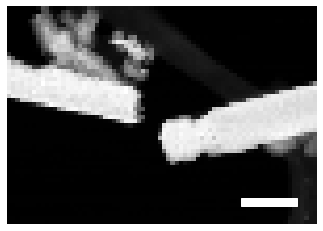

In [ ]:
scalebar = 100 # nm
k = 0
image, scale = Images[k], Scales[k]

origin = (image.shape[1]*0.75, image.shape[0]*0.87)

plt.imshow(image, cmap = 'gray')
ax = plt.gca()
ax.add_patch(patches.Rectangle((origin), scalebar/scale, 2, color = 'white', fill = True))
ax.axis('off')

# Load, organize, process data
* EEL spectra in low loss regime contain the zero loss peak which is the most dominant spectral feature by orders of magnitude.
* Core loss spectra can have strong features (edges, plasmons) that should be deconvolved to study the features of interest
* The following cells accomplish these steps

In [ ]:
%%capture
!wget https://www.dropbox.com/s/rqe621qzy25a9n7/lowloss_file.npz
!wget https://www.dropbox.com/s/biwmqwksnjrps9s/Coreloss_data.npz

lowloss_file = np.load('lowloss_file.npz')
coreloss_file = np.load('Coreloss_data.npz')

In [ ]:
print(lowloss_file.files)
print(coreloss_file.files)

['scale', 'E', 'ENB', 'SI', 'SINB']
['SINB', 'ENB', 'SI', 'E']


## Lowloss processing

In [ ]:
EELS_data = 'lowloss'  # choose 'lowloss' or 'coreloss'

#############################################################
if EELS_data == "lowloss":
  SI, E, scale = lowloss_file['SI'], lowloss_file['E'], lowloss_file['scale']
elif EELS_data == "coreloss":
  SI, E = coreloss_file['SI'], coreloss_file['E']

* Correct some bad pixels

In [ ]:
badpix = []
for m in range(SI.shape[0]):
  for n in range(SI.shape[1]):
    avg = np.mean(SI[m,n,:])
    if avg < 200:  # The average of a spectrum should certainly not be negative (technically nothing should be negative for counts..) 
      badpix.append([m,n])

SI_fixed = np.copy(SI)
for k in range(len(badpix)):
  avg = np.mean(SI_fixed[badpix[k][0], badpix[k][1]])
  SI_fixed[badpix[k][0], badpix[k][1]] -= avg

* Background subtraction:

In [ ]:
# test a random pixel or two in each spectrum image to check the fitting performance
# 2 region power law fit, in this case we effectively use one region (since r1b = r2a)

r1a = 0.06
r1b = 0.11
r2a = 0.11
r2b = 0.13

I,J = 21,25
# I,J=np.random.randint(SI_fixed.shape[0]),np.random.randint(SI_fixed.shape[1])
testE1,testS1=FitPowerlaw2R_THICK(E,SI_fixed[I,J],r1a,r1b,r2a,r2b, threshold = 6000)
I,J

* Repeat for all [x,y] pixels


In [ ]:
# r1a, r1b, r2a, r2b = 0.07, 0.09, 0.09, 0.12
r1a, r1b, r2a, r2b = 0.06, 0.11, 0.11, 0.13


NBCalc=np.asarray([[RemoveBackgroundSI2R_THICK(E,s,r1a,r1b,r2a,r2b,threshold = 2000) for s in row] for row in SI_fixed])
SINB_ = NBCalc[:,:,1,:]
ENB_ = NBCalc[0,0,0,:]

In [ ]:
# Cut energies below 0.15 eV... 
truncate = 0.15

idx = (np.abs(ENB_ - truncate)).argmin()
SINB = SINB_[:,:,idx:]
ENB = ENB_[idx:]

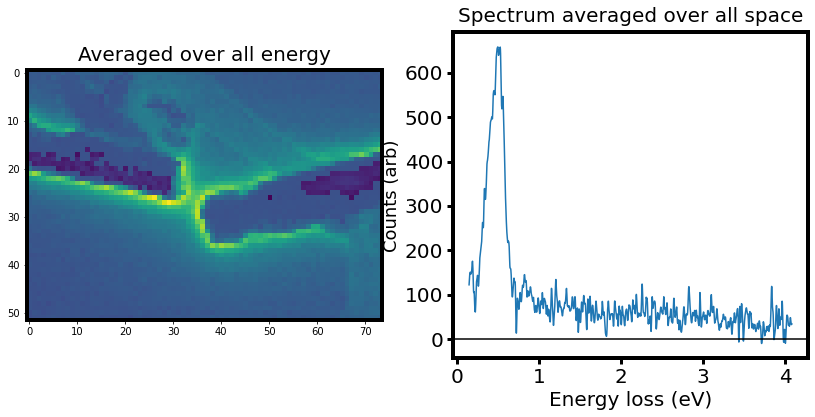

In [ ]:
colormap = 'viridis'

_,ax = plt.subplots(1,2,figsize=(14,6))
avg_img = np.mean(SINB,axis=2)
avg_spec = np.mean(SINB,axis=(0,1))

ax[0].imshow(avg_img, cmap = colormap)
ax[1].plot(ENB,avg_spec)
# plt.setp(ax[0], xticks=[], yticks=[]);
for axes in ax:
  for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(4)
ax[1].set_xlabel('Energy loss (eV)', fontsize = 20)
ax[1].tick_params(labelsize = 20, length = 6, width = 3)
ax[1].set_ylabel('Counts (arb)', fontsize = 18)
ax[1].axhline(0, color = 'k')

ax[0].set_title('Averaged over all energy',fontsize = 20, pad = 10)
ax[1].set_title('Spectrum averaged over all space',fontsize = 20, pad = 10);

# xx,yy = 21,25
# ax[0].scatter(yy,xx,c='r')

In [ ]:
badpix = []
for m in range(SINB.shape[0]):
  for n in range(SINB.shape[1]):
    avg = np.mean(SINB[m,n,:])
    if avg < 0:  # The average of a spectrum should certainly not be negative (technically nothing should be negative for counts..) 
      # print(avg)
      badpix.append([m,n])

SINB_fixed = np.copy(SINB)
for k in range(len(badpix)):
  avg = np.mean(SINB_fixed[badpix[k][0], badpix[k][1]])
  SINB_fixed[badpix[k][0], badpix[k][1]] -= avg

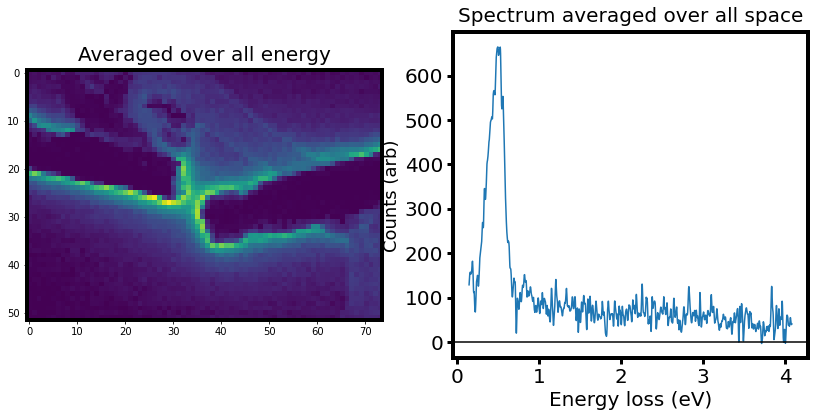

In [ ]:
colormap = 'viridis'

_,ax = plt.subplots(1,2,figsize=(14,6))
avg_img = np.mean(SINB_fixed,axis=2)
avg_spec = np.mean(SINB_fixed,axis=(0,1))

ax[0].imshow(avg_img, cmap = colormap)
ax[1].plot(ENB,avg_spec)
# plt.setp(ax[0], xticks=[], yticks=[]);
for axes in ax:
  for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(4)
ax[1].set_xlabel('Energy loss (eV)', fontsize = 20)
ax[1].tick_params(labelsize = 20, length = 6, width = 3)
ax[1].set_ylabel('Counts (arb)', fontsize = 18)
ax[1].axhline(0, color = 'k')

ax[0].set_title('Averaged over all energy',fontsize = 20, pad = 10)
ax[1].set_title('Spectrum averaged over all space',fontsize = 20, pad = 10);

# xx,yy = 21,25
# ax[0].scatter(yy,xx,c='r')

In [ ]:
np.savez('Lowloss_data.npz',
         E=E,
         ENB=ENB,
         SI=SI,
         SINB=SINB_fixed)

## Coreloss processing

In [ ]:
EELS_data = 'coreloss'  # choose 'lowloss' or 'coreloss'

#############################################################
if EELS_data == "lowloss":
  SI, E, scale = lowloss_file['SI'], lowloss_file['E'], lowloss_file['scale']
elif EELS_data == "coreloss":
  SI, E = coreloss_file['SI'], coreloss_file['E']

(23, 42)

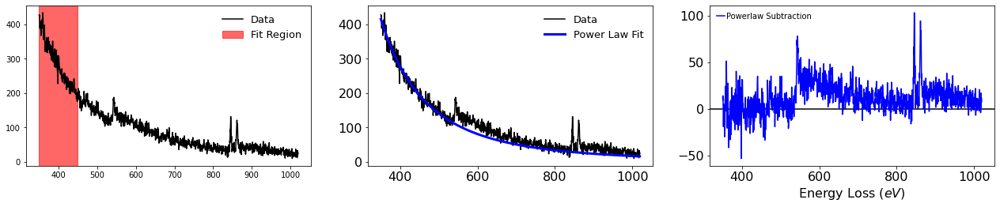

In [ ]:
# Fit power law to the background signal. Simplest, fairly robust, method imo
E1a = 350
E1b = 450

# Test it on single pixel
I,J = np.random.randint(0,SI.shape[0]), np.random.randint(0,SI.shape[1])

testE1, testS1=FitPowerlaw(E,SI[I,J],E1a,E1b, plot = True)
I,J

* Repeat for all [x,y] pixels

In [ ]:
E1a = 350
E1b = 450

Emin = np.argmin(np.abs(E-E1a))
SINB_coreloss = np.zeros((SI.shape[0], SI.shape[1], SI.shape[2] - Emin))

for ii in range(SI.shape[0]):
  for jj in range(SI.shape[1]):
    _, SINB_coreloss[ii,jj] = FitPowerlaw(E,SI[ii,jj],E1a,E1b, plot = False)

ENB_coreloss = E[Emin:]

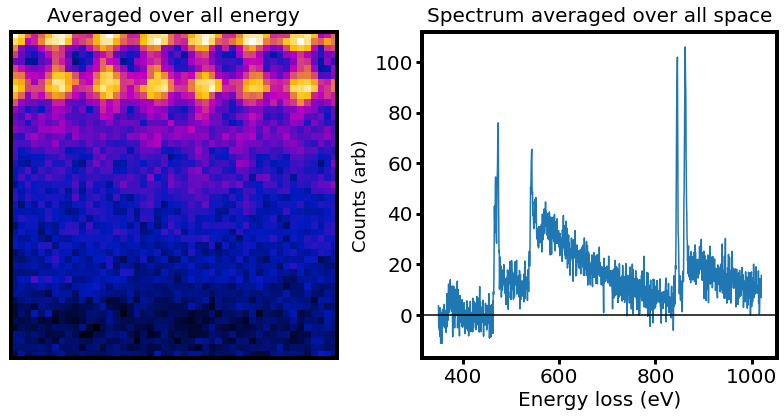

In [ ]:
colormap = Blackbody

_,ax = plt.subplots(1,2,figsize=(14,6))
avg_img = np.mean(SINB_coreloss,axis=2)
avg_spec = np.mean(SINB_coreloss,axis=(0,1))

ax[0].imshow(avg_img, cmap = colormap)
ax[1].plot(ENB_coreloss,avg_spec)
plt.setp(ax[0], xticks=[], yticks=[]);
for axes in ax:
  for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(4)
ax[1].set_xlabel('Energy loss (eV)', fontsize = 20)
ax[1].tick_params(labelsize = 20, length = 6, width = 3)
ax[1].set_ylabel('Counts (arb)', fontsize = 18)
ax[1].axhline(0, color = 'k')

ax[0].set_title('Averaged over all energy',fontsize = 20, pad = 10)
ax[1].set_title('Spectrum averaged over all space',fontsize = 20, pad = 10);

# Using processed data
* For convenience, the data has already been aligned and background subtracted (zero-loss peak removed).
* These steps are in the preceeding section for reproducibility
* Select dataset (low loss or core loss)

# Low loss

In [ ]:
%%capture
!wget https://www.dropbox.com/s/rqe621qzy25a9n7/lowloss_file.npz
lowloss_file = np.load('lowloss_file.npz')

In [ ]:
lowloss_file.files

['scale', 'E', 'ENB', 'SI', 'SINB']

In [ ]:
EELS_data = 'lowloss'  # choose 'lowloss' or 'coreloss'

#############################################################
if EELS_data == "lowloss":
  SI, E, scale = lowloss_file['SINB'], lowloss_file['ENB'],  lowloss_file['scale']
elif EELS_data == "coreloss":
  SI, E = coreloss_file['SINB'], coreloss_file['ENB']

* View the spectrum image averaged over all energy, and the average spectrum over all space


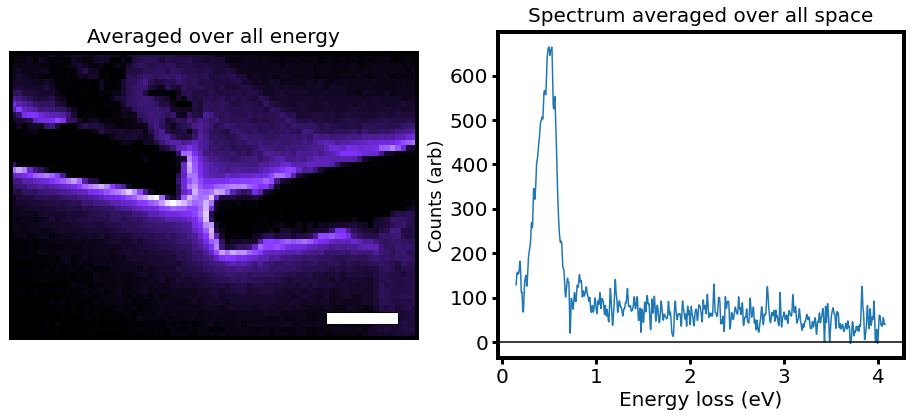

In [ ]:
colormap = Blackbody
colormap = Cmap_Purple
scalebar = 100 # nm

_,ax = plt.subplots(1,2,figsize=(16,6))
avg_img = np.mean(SI,axis=2)
avg_spec = np.mean(SI,axis=(0,1))

ax[0].imshow(avg_img, cmap = colormap)
ax[1].plot(E,avg_spec)
plt.setp(ax[0], xticks=[], yticks=[]);
for axes in ax:
  for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(4)
ax[1].set_xlabel('Energy loss (eV)', fontsize = 20)
ax[1].tick_params(labelsize = 20, length = 6, width = 3)
ax[1].set_ylabel('Counts (arb)', fontsize = 18)
ax[1].axhline(0, color = 'k')

ax[0].set_title('Averaged over all energy',fontsize = 20, pad = 10)
ax[1].set_title('Spectrum averaged over all space',fontsize = 20, pad = 10);



length = scalebar/scale  
height = length/6 
origin = 0.77*avg_img.shape[1], 0.9*avg_img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

cbar = ax[0]

## Linear decomposition (PCA, NMF)

In [ ]:
data = SI
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

* Scree plot to check variance

In [ ]:
pca = decomposition.PCA()
pca.fit(X_vec)

PCA()

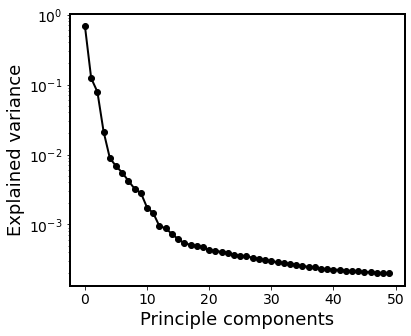

In [ ]:
plt.figure(figsize=(6,5))
ax = gca()
plt.plot(pca.explained_variance_ratio_[0:50], '-o', linewidth=2, c = 'black')
plt.xlabel('Principle components', fontsize = 18)
plt.ylabel('Explained variance', fontsize = 18)

plt.tick_params(labelsize = 14)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(2)

plt.yscale('log')

In [ ]:
X_vec = np.copy(SI.reshape((SI.shape[0]*SI.shape[1],SI.shape[2])))
X_vec[np.where(X_vec<0)]=0  # set any negative values to 0 (NMF doesn't allow negative values)

* Select number of components (can be based on PCA scree plot) and type of decomposition (PCA or NMF here)

In [ ]:
# Select number of components
nc = 30 

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'NMF'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
    
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_nmf.py:294: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  FutureWarning,


(30, 1949) (3848, 30)


/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  ConvergenceWarning,


View the decomposed spectral components and abundance maps:

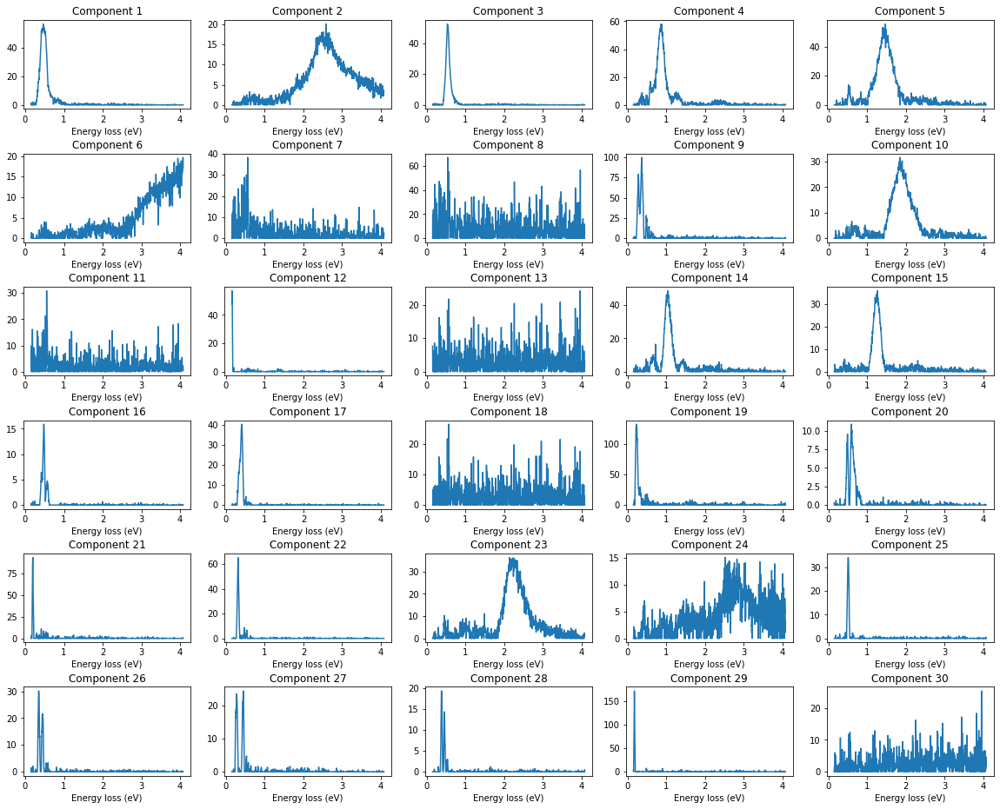

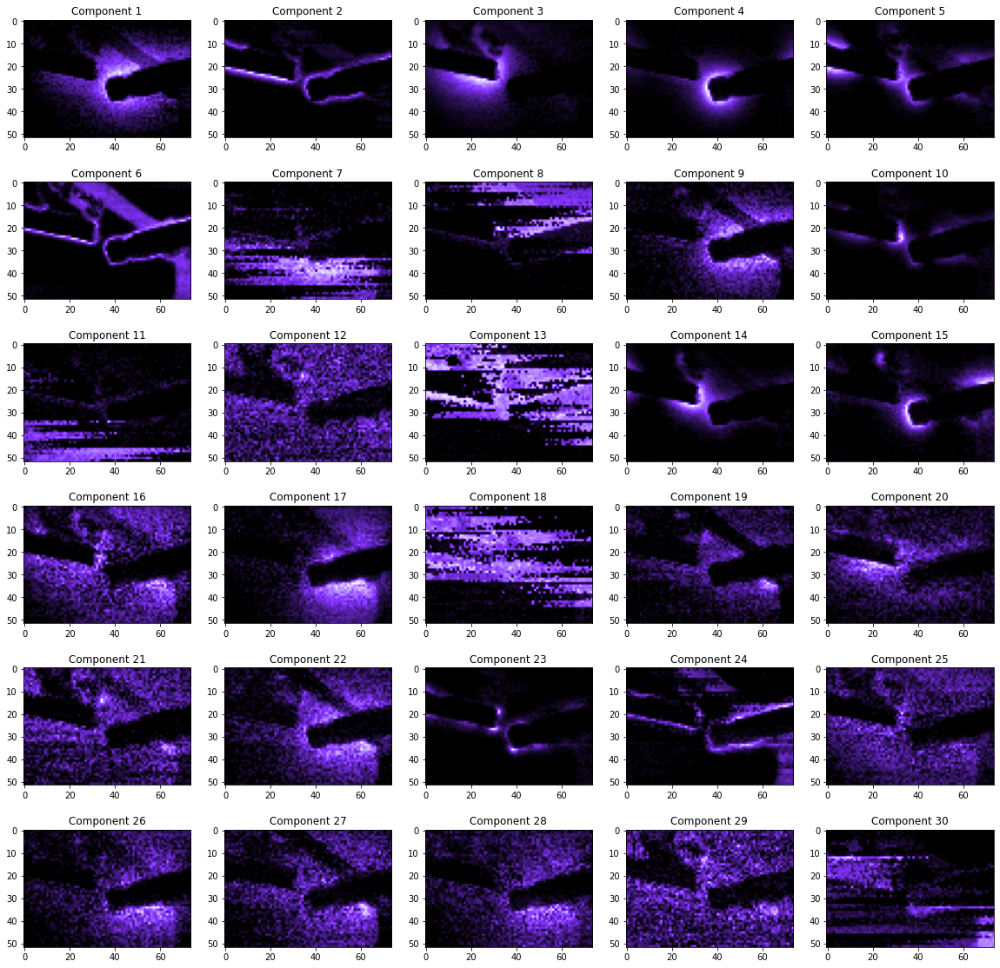

In [ ]:
colormap = Blackbody
colormap = Cmap_Purple

rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

gs1 = gridspec.GridSpec(rows, cols, hspace = 0.5)
fig1 = plt.figure(figsize = (4*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(E,components[i])
    ax1.set_xlabel('Energy loss (eV)')
    ax1.set_title('Component ' + str(i + 1))

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = colormap)
    ax2.set_title('Component ' + str(i + 1))


* For multichannel rVAE, we will need to **select the components** (specifically, the abundance maps) with which we want to analyze.
* (These will be used later in the <u>Multichannel rVAE</u> section)
* For instance:

In [ ]:
Selected_NMF = [0,1,2,3,4,9,13,14,22]

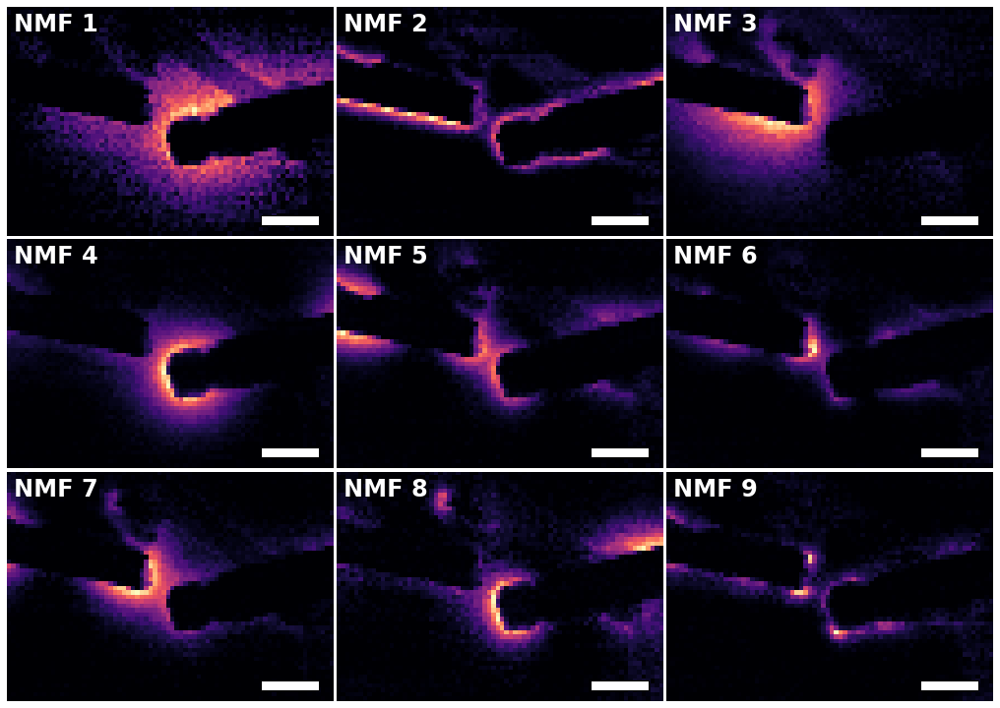

In [ ]:
colormap = Cmap_Purple
colormap = 'magma'
# colormap = 'jet'

num_comps = len(Selected_NMF)
rows = int(np.ceil(float(num_comps)/3))
cols = int(np.ceil(float(num_comps)/rows))
scalebar = 100 # nm

fig = plt.figure(figsize=(17.95,13.0))
gs= gridspec.GridSpec(rows, cols, wspace = 0.01, hspace = 0.01)
for kk in range(num_comps):
    ax = fig.add_subplot(gs[kk])
    ax.imshow(X_vec_t[:, Selected_NMF[kk]].reshape(d1, d2), cmap = colormap)
    ax.axis('off')
    # ax.set_title('NMF {}'.format(kk+1), weight = 'bold', fontsize = 22)
    ax.text(1, 5, "NMF {}".format(kk+1), weight = 'bold', fontsize = 24, color = 'w')
    length = scalebar/scale  
    height = length/6 
    origin = 0.77*avg_img.shape[1], 0.9*avg_img.shape[0]
    ax.add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

And their corresponding spectral components...

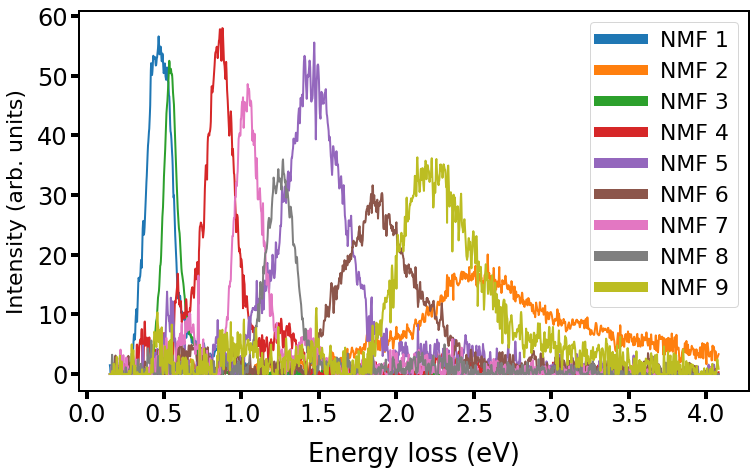

In [ ]:
num_comps = len(Selected_NMF)

fig = plt.figure(figsize=(12,7))
ax = plt.gca()

ax.set_xlabel('Energy loss (eV)', fontsize = 26, labelpad = 15)
ax.set_ylabel('Intensity (arb. units)', fontsize = 22, labelpad = 10)
for kk in range(num_comps):
    ax.plot(E,components[Selected_NMF[kk]], label = 'NMF {}'.format(kk+1), lw = 2)


ax.tick_params(labelsize = 24, length = 8, width = 4)

leg = ax.legend(fontsize=22)
for line in leg.get_lines():
    line.set_linewidth(10)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(2)

## 1D VAE

Prepare the data
  * subtract average spectrum from all pixels
  * normalize to [0,1] 

In [ ]:
subtract_average  = True
normalized        = True

work_array = data.copy()
d1, d2, d3 = work_array.shape

X_train = work_array.reshape(d1 * d2, d3)

if subtract_average:
  X_train = X_train - X_train.mean(axis = 0)

if normalized: 
  X_train = normalize(X_train)

X_train = np.expand_dims(X_train, axis = 2)
print(X_train.shape)

(3848, 1949, 1)


* Select number of:
  * Latent dimensions, note if 2 dims, we can visualize the latent manifold in 2D
  * training cycles (aka epochs, several hundred are typically sufficient - depends on loss minimization)

In [ ]:
LATENT = 2
EPOCHS = 400

input_dim = (X_train.shape[1], 1)

# Intitialize model
vae = aoi.models.VAE(input_dim, latent_dim=LATENT, 
                        numlayers_encoder=3, numhidden_encoder=512,
                        numlayers_decoder=3, numhidden_decoder=512,
                        skip=False, random_state = 42) 

In [ ]:
# Train
vae.fit(X_train, training_cycles=EPOCHS, batch_size=32, loss="mse", 
        capacity = [20, 10, 1])

# capacity = [10,100,1]

Epoch: 1/400, Training loss: 8.6288
Epoch: 2/400, Training loss: 1.9341
Epoch: 3/400, Training loss: 1.8315
Epoch: 4/400, Training loss: 0.9996
Epoch: 5/400, Training loss: 0.7004
Epoch: 6/400, Training loss: 0.6624
Epoch: 7/400, Training loss: 0.6577
Epoch: 8/400, Training loss: 0.6767
Epoch: 9/400, Training loss: 0.6486
Epoch: 10/400, Training loss: 0.6564
Epoch: 11/400, Training loss: 0.6599
Epoch: 12/400, Training loss: 0.6419
Epoch: 13/400, Training loss: 0.6450
Epoch: 14/400, Training loss: 0.6523
Epoch: 15/400, Training loss: 0.6268
Epoch: 16/400, Training loss: 0.6495
Epoch: 17/400, Training loss: 0.6257
Epoch: 18/400, Training loss: 0.5930
Epoch: 19/400, Training loss: 0.5116
Epoch: 20/400, Training loss: 0.4868
Epoch: 21/400, Training loss: 0.4601
Epoch: 22/400, Training loss: 0.4503
Epoch: 23/400, Training loss: 0.4406
Epoch: 24/400, Training loss: 0.4415
Epoch: 25/400, Training loss: 0.4317
Epoch: 26/400, Training loss: 0.4248
Epoch: 27/400, Training loss: 0.4161
Epoch: 28/

In [ ]:
fname = 'VAE_modelweights_new_incl-capacity_10-100-1'  # Choose a filename to save the weights. They can be loaded without training again
vae.save_weights(fname)
files.download(fname+'.tar')

* If a model is already trained, we can upload it here, and load it:

In [ ]:
files.upload()

Saving VAE_modelweights_new.tar to VAE_modelweights_new (1).tar


In [ ]:
LATENT = 2
EPOCHS = 400
input_dim = (X_train.shape[1], 1)

vae = aoi.models.VAE(input_dim, latent_dim=LATENT, 
                        numlayers_encoder=3, numhidden_encoder=512,
                        numlayers_decoder=3, numhidden_decoder=512,
                        skip=False, random_state = 42) 

In [ ]:
uploadedweights = 'VAE_modelweights_new_incl-capacity_10-100-1.tar'
vae.load_weights(uploadedweights)

* Use VAE model to extract encoded latent features
* Note, if more than 2 latent features were used in the model, you may select different latent features to view in 2D.

In [ ]:
z_mean, z_sd = vae.encode(X_train)

df = pd.DataFrame(z_mean, columns = ['Latent 1', 'Latent 2'])

x = df['Latent 1']
y = df['Latent 2']

z_mean.shape

(3848, 2)

* View latent space distribution overlaid with kernel density estimation (KDE)

(-2.0, 1.0)

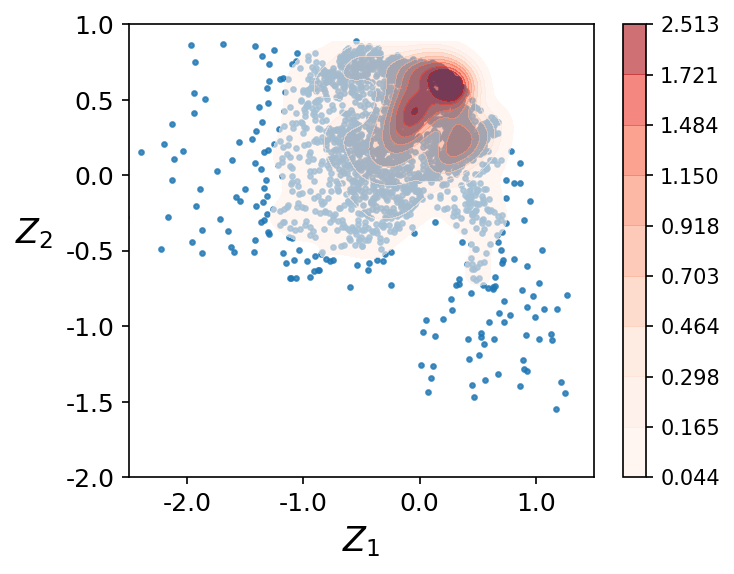

In [ ]:
plt.figure(figsize=(5,4), dpi = 150)
ax = sns.regplot(x=x, y=y, fit_reg = False, scatter_kws={"s": 5})
ax = sns.kdeplot(x=x, y=y, cmap="Reds", shade=True, thresh = 0.05, cut = 0, alpha = 0.6, cbar = True)
ax.set_xlabel(xlabel = '$Z_1$', fontdict={'fontsize' : 16})
ax.set_ylabel(ylabel = '$Z_2$', fontdict={'fontsize' : 16}, rotation = 0, labelpad = 15)
ax.set_xticklabels(np.round(ax.get_xticks(), decimals=2), size = 12)
ax.set_yticklabels(np.round(ax.get_yticks(), decimals=2), size = 12)
ax.figure.axes[-1].yaxis.label.set_size(4)

ax.set_xlim(-2.5,1.5)
ax.set_ylim(-2,1)

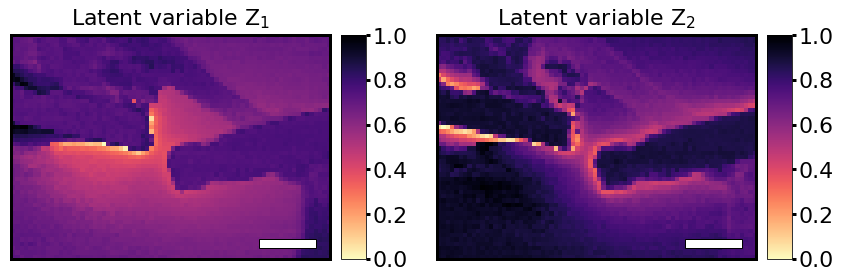

In [ ]:
colormap = Blackbody  # Select a colormap
colormap = 'magma_r'
scalebar = 100 # in nm


latent_maps = []
for k in range(z_mean.shape[1]):
  latent_maps.append(normalize(z_mean[:,k].reshape(d1,d2)))

rows = int(np.ceil(float(LATENT)/3))
cols = int(np.ceil(float(LATENT)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (14,8))   
for k in range(len(latent_maps)):
  ax = fig.add_subplot(gs[k])
  im = ax.imshow(latent_maps[k], cmap = colormap)
  ax.set_title("Latent variable Z$_{}$".format(k+1), fontsize = 22, pad = 10)
  for borders in ['top','bottom','left','right']:
    ax.spines[borders].set_linewidth(3)
    ax.spines[borders].set_color('k')
    ax.set_xticks([]), ax.set_yticks([])
  cb = plt.colorbar(im, ax=ax, fraction = 0.07, pad = 0.03, aspect = 9, shrink = 1)
  cb.ax.tick_params(labelsize=22, width = 3)
  length = scalebar/scale  
  height = length/6 
  origin = 0.77*latent_maps[k].shape[1], 0.9*latent_maps[k].shape[0]
  ax.add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w')) 

* Collect the encoded latent features and project them into original 2D space

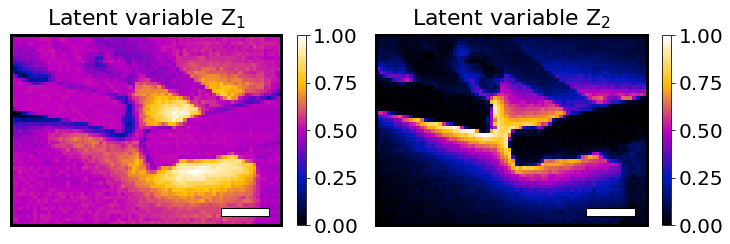

In [ ]:
colormap = Blackbody  # Select a colormap
scalebar = 100 # in nm

latent_maps = []
for k in range(z_mean.shape[1]):
  latent_maps.append(normalize(z_mean[:,k].reshape(d1,d2)))

rows = int(np.ceil(float(LATENT)/3))
cols = int(np.ceil(float(LATENT)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 3.5*(rows)))   
for k in range(len(latent_maps)):
  ax = fig.add_subplot(gs[k])
  im = ax.imshow(latent_maps[k], cmap = colormap)
  ax.set_title("Latent variable Z$_{}$".format(k+1), fontsize = 22, pad = 10)
  for borders in ['top','bottom','left','right']:
    ax.spines[borders].set_linewidth(3)
    ax.spines[borders].set_color('k')
    ax.set_xticks([]), ax.set_yticks([])
  cb = plt.colorbar(im, ax=ax, fraction = 0.046, pad = 0.05)
  cb.ax.tick_params(labelsize=20)
  length = scalebar/scale  
  height = length/6 
  origin = 0.77*latent_maps[k].shape[1], 0.9*latent_maps[k].shape[0]
  ax.add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w')) 

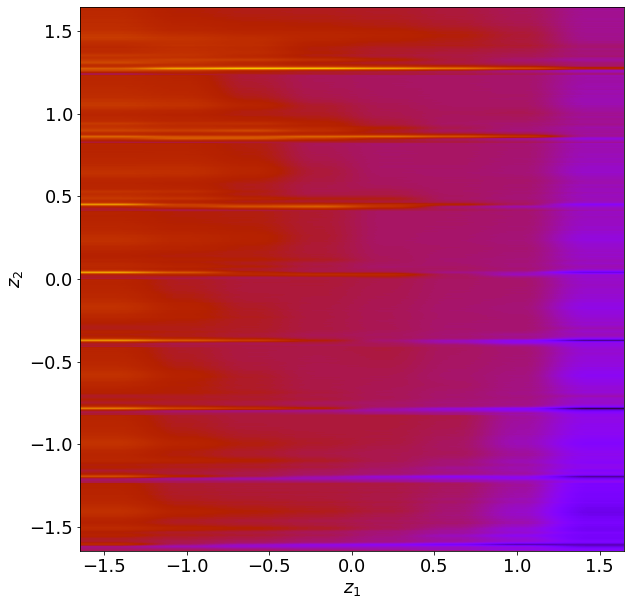

In [ ]:
vae.manifold2d(d=8);

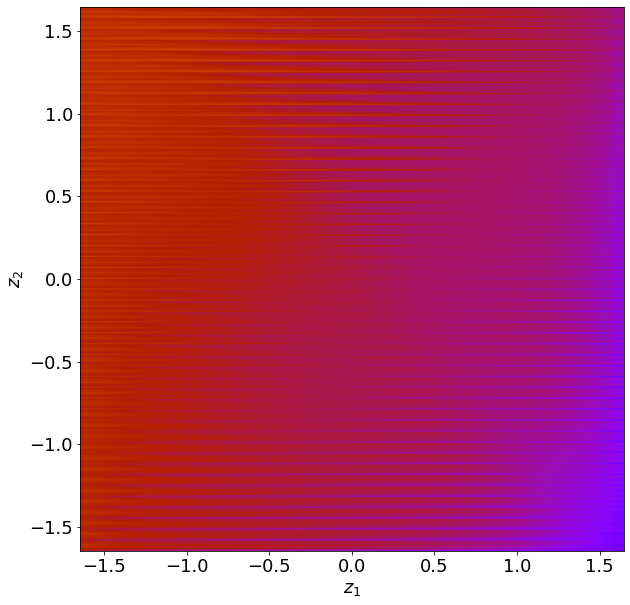

In [ ]:
vae.manifold2d(d=50);

* Observe the reconstruction performance and mean squared error (MSE) loss compared to the original data

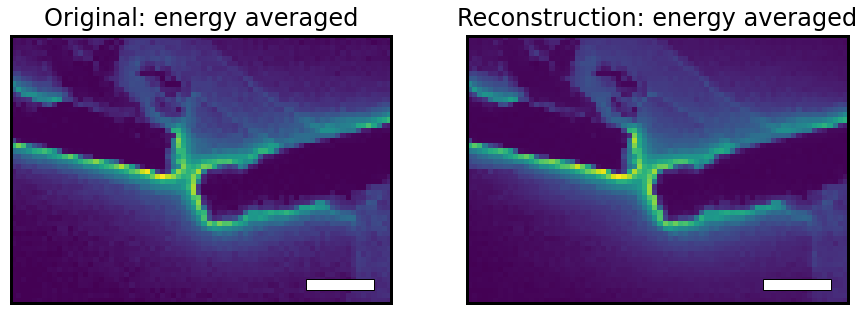

In [ ]:
colormap = 'viridis'
scalebar = 100 # in [nm]


original_data = X_train.reshape(d1,d2,d3)
encoded_data = np.copy(z_mean)
reconstructed_ = vae.decode(z_mean[:,:])
reconstructed = np.reshape(reconstructed_, (d1,d2,d3))

reconstructed_mean = normalize(np.mean(reconstructed,axis=2))
original_mean = normalize(np.mean(original_data,axis=2))

fig,ax = plt.subplots(1,2,figsize=(15,7))
ax[0].imshow(original_mean, cmap = colormap)
ax[1].imshow(reconstructed_mean, cmap = colormap)
ax[0].set_title("Original: energy averaged", fontsize = 24, pad = 10)
ax[1].set_title("Reconstruction: energy averaged", fontsize = 24, pad = 10)
# ax[0].axis('off'),ax[1].axis('off');
length = scalebar/scale  
height = length/6 
origin = 0.77*latent_maps[k].shape[1], 0.9*latent_maps[k].shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))
ax[1].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))
axes = [ax[0], ax[1]]
for axis in axes:
  for borders in ['top','bottom','left','right']:
      axis.spines[borders].set_linewidth(3)
      axis.spines[borders].set_color('k')
      axis.set_xticks([]), axis.set_yticks([])

Get the Error:

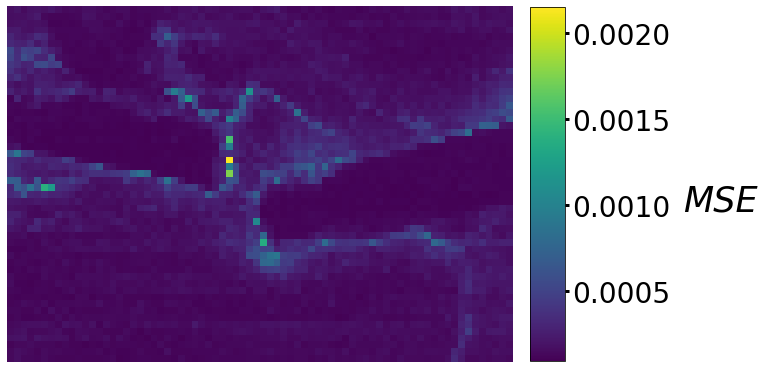

In [ ]:
colormap = 'viridis'

errormap = np.zeros( reconstructed.shape[0:2] )
for ii in range(errormap.shape[0]):
  for jj in range(errormap.shape[1]):
    errormap[ii,jj] = MSE(original_data[ii,jj], reconstructed[ii,jj])

_,ax = plt.subplots(1,figsize=(10,8))
im = ax.imshow(errormap, cmap = colormap)
ax.axis('off')
cb = plt.colorbar(im, ax=ax, fraction = 0.0635, pad = 0.03, aspect = 10)
cb.ax.tick_params(labelsize=28, width = 3) 
cb.set_label("MSE", style = "italic", labelpad = 50, size = 35, rotation = 0)

# length = scalebar/scale  
# height = length/6 
# origin = 0.77*latent_maps[k].shape[1], 0.9*latent_maps[k].shape[0]
# # ax.add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

for borders in ['top','bottom','left','right']:
  ax.spines[borders].set_linewidth(3)
  ax.spines[borders].set_color('k')
  ax.set_xticks([]), ax.set_yticks([])

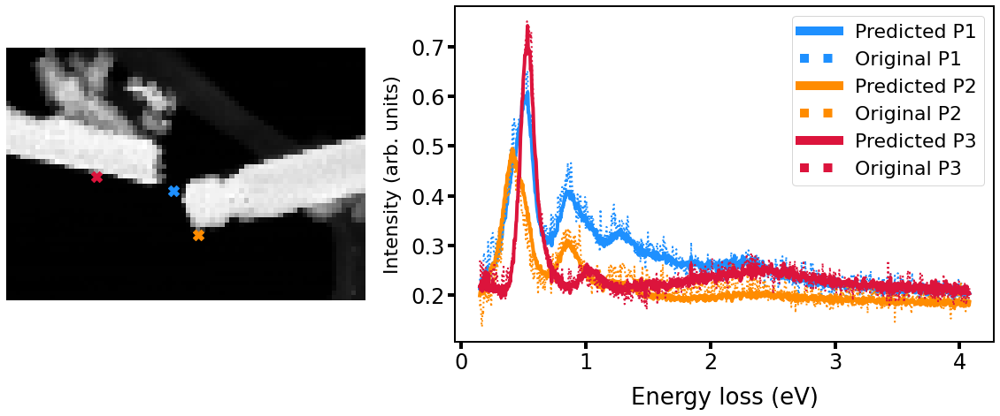

In [ ]:
# selected_points = [(24,34),
#                    (39, 40)]
selected_points = [(29,34),
                   (38, 39),
                   (26,18)]
Colors = ['dodgerblue', 'darkorange', 'crimson']

fig = plt.figure(figsize=(20,7))
gs = gridspec.GridSpec(1,2, width_ratios=[1,1.5])
ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

ax1.imshow(image, cmap ='gray')
ax1.axis('off')

ax2.set_xlabel('Energy loss (eV)', fontsize = 26, labelpad = 15)
ax2.set_ylabel('Intensity (arb. units)', fontsize = 22, labelpad = 10)

for i,p in enumerate(selected_points):
  ax2.plot(E, reconstructed[p], label = 'Predicted P{}'.format(i+1), lw = 4, color=Colors[i])
  ax2.plot(E, original_data[p], label = 'Original P{}'.format(i+1), lw = 2, ls='dotted', color=Colors[i])
  # ax1.scatter(p[1], p[0], c='r', s=150, marker = 'X')
  ax1.scatter(p[1], p[0], c=Colors[i], s=150, marker = 'X')


ax2.tick_params(labelsize = 24, length = 8, width = 4)

leg = ax2.legend(fontsize=22)
for line in leg.get_lines():
    line.set_linewidth(10)

for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(2)

## *** Multichannel rVAE ***

* Here we use our domain expertise (bias) to select the "best" NMF abundance maps to the rVAE model.
* "Best" here is defined as what features we are most interested in! So  **this allows one to specifically choose the spectral features that we are most interested in** and see how they impact the system and data.
* This ordering is more critical for the fewer number of channels (i.e., 3)
* We explore using individually normalized channels, still.

### 3 channels
* Now we will use the decomposed abundance maps from NMF earlier.
* Let's recall the selected channels, and further down-select for the features of interest to us:

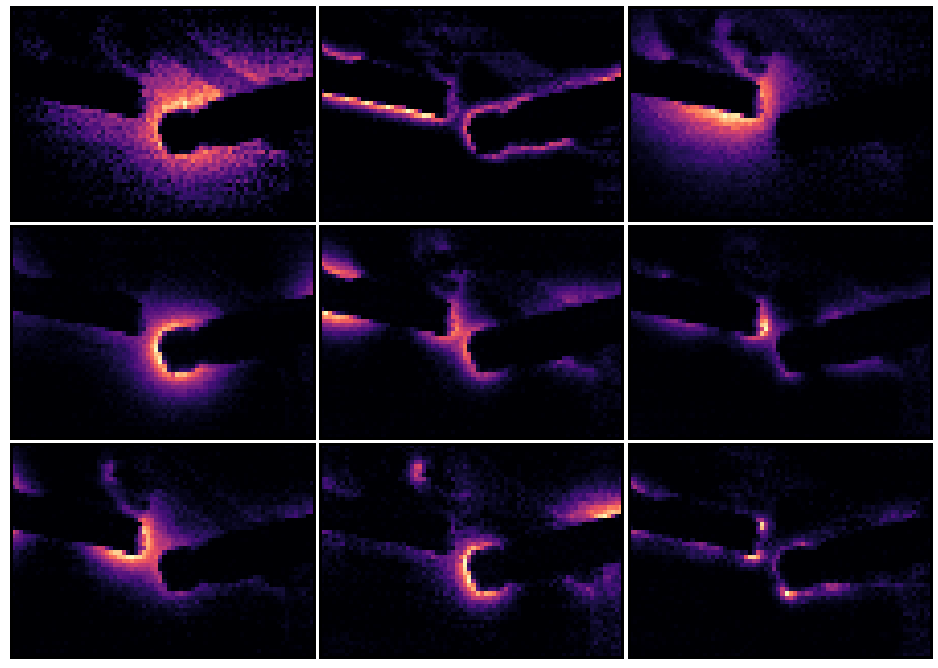

In [ ]:
colormap = Blackbody
colormap = 'magma'

layers = len(Selected_NMF)
X_vec_t_selected = np.zeros((X_vec_t.shape[0], layers))
for k in range(layers):
  X_vec_t_selected[:,k] = X_vec_t[:,Selected_NMF[k]]

rows = 3
cols = 3
gs = gridspec.GridSpec(rows, cols, wspace = 0.02, hspace = 0.02)
fig = plt.figure(figsize = (16.5,12))   
for i in range(layers):
    ax = fig.add_subplot(gs[i])
    abundancemap = X_vec_t_selected[:, i].reshape(d1, d2)
    ax.imshow(abundancemap, cmap = colormap)

    for borders in ['top','bottom','left','right']:
      ax.spines[borders].set_linewidth(3)
      ax.spines[borders].set_color('k')
      ax.set_xticks([]), ax.set_yticks([])

* First three of these look reasonable, 
* but we may select different layers, or increase number of layers
* Also, may adjust # latent dimensions
  * using 2 has the benefit of visualizing the latent manifold in 2D

In [ ]:
comps = 0,1,2
# comps = 0,2,5

LATENT = 2
LAYERS = len(comps)

EPOCHS = 200

winsize = 10   # 10 default,  Ideally should be commensurate with general size of the features (in pixels). 
               # A brief examination on influence of window size is shown in the supplemental details of the paper.

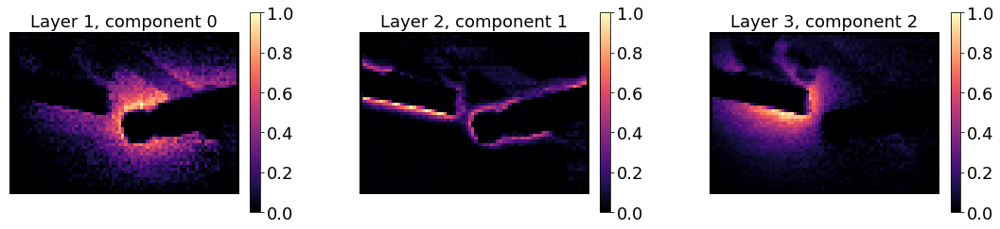

In [ ]:
weight_layer_2 = False # False is default

# work_array_ = X_vec_t_selected.reshape(d1, d2, len(Selected_decomped_ims))
work_array_ = X_vec_t_selected.reshape(d1, d2, len(Selected_NMF))

work_array = np.stack((work_array_[:,:,comps[0]], 
                       work_array_[:,:,comps[1]], 
                       work_array_[:,:,comps[2]]
                       ),axis=2)
if len(work_array.shape) == 2:
  work_array = work_array.reshape((work_array.shape[0], work_array.shape[1],1))


# Normalize layers individually
for k in range(work_array.shape[2]):
  work_array[:,:,k] = normalize(work_array[:,:,k])

# # assign Layer 2 more weight:
if weight_layer_2:
  work_array[:,:,1] *= 2

# Show input layers
rows = int(np.ceil(LAYERS/3))
cols = int(np.ceil(LAYERS/rows))

gs = gridspec.GridSpec(rows, cols, wspace = 0.4)
fig = plt.figure(figsize = (6*cols, 5*rows))

for k in range(LAYERS):
    ax = fig.add_subplot(gs[k])
    im = ax.imshow(work_array[:,:,k], cmap=colormap)
    for axis in ['top','bottom','left','right']:
      ax.spines[axis].set_linewidth(3)
    plt.setp(ax,xticks=[],yticks=[])
    ax.set_title('Layer {}, component {}'.format(k+1, k), fontsize = 18)
    cb = plt.colorbar(im, ax=ax, fraction = 0.04, pad = 0.05)
    cb.ax.tick_params(labelsize=18) 

In [ ]:
x_window_size = winsize
y_window_size = winsize

# Array to store cookies
feature_arr = np.expand_dims(np.zeros((x_window_size, y_window_size, LAYERS)),axis = 0)
info_arr= np.zeros((2))

for i in range(int(x_window_size/2), int(d1 - x_window_size/2), 1):
  for j in range(int(y_window_size/2), int(d2 - y_window_size/2), 1):
    arr_loc  = MakeLayeredCookie(work_array, i, j, x_window_size, y_window_size) 
    feature_arr = np.append(feature_arr, arr_loc, axis = 0)
    info_arr = np.column_stack((info_arr, (i,j)))

info_arr = info_arr[:,1:].T
feature_arr = feature_arr[1:,:,:,:]
feature_arr.shape

(968, 30, 30, 3)

In [ ]:
in_dim = (x_window_size, y_window_size, LAYERS)

anneal_dict = {"kl_im": np.linspace(1, 5, 200),
               "kl_rot": np.linspace(2, 20, 200)}
rvae = None
rvae = aoi.models.rVAE(in_dim, translation = False, latent_dim=LATENT)

<font size=5> >>> Train <<< </font>

In [ ]:
# rvae = None
# rvae = aoi.models.rVAE(in_dim, translation = False, latent_dim=LATENT)
rvae.fit(feature_arr, anneal_dict = anneal_dict, training_cycles=EPOCHS, random_state = 42,
         capacity = [5, 10, 1])

Epoch: 1/200, Training loss: 61.7388
Epoch: 2/200, Training loss: 47.5005
Epoch: 3/200, Training loss: 46.4631
Epoch: 4/200, Training loss: 45.0620
Epoch: 5/200, Training loss: 43.3436
Epoch: 6/200, Training loss: 42.2290
Epoch: 7/200, Training loss: 41.5251
Epoch: 8/200, Training loss: 40.9425
Epoch: 9/200, Training loss: 40.2728
Epoch: 10/200, Training loss: 39.7508
Epoch: 11/200, Training loss: 39.1748
Epoch: 12/200, Training loss: 38.5923
Epoch: 13/200, Training loss: 38.0924
Epoch: 14/200, Training loss: 37.5167
Epoch: 15/200, Training loss: 37.1152
Epoch: 16/200, Training loss: 36.6686
Epoch: 17/200, Training loss: 36.4173
Epoch: 18/200, Training loss: 36.1648
Epoch: 19/200, Training loss: 35.8551
Epoch: 20/200, Training loss: 35.5442
Epoch: 21/200, Training loss: 35.2711
Epoch: 22/200, Training loss: 35.0552
Epoch: 23/200, Training loss: 34.7314
Epoch: 24/200, Training loss: 34.4471
Epoch: 25/200, Training loss: 34.2482
Epoch: 26/200, Training loss: 34.0062
Epoch: 27/200, Traini

In [ ]:
# fname = 'rvae_modelweights_0-1-2_global-norm'  # Choose a filename to save the weights. They can be loaded without training again
fname = 'rvae_modelweights_0-1-2_capacity_5-10-1'  # Choose a filename to save the weights. They can be loaded without training again
fname = 'rvae_modelweights_0-2-5_capacity_5-10-1'
fname = 'rvae_modelweights_5-6-8_capacity_5-10-1'
fname = 'rvae_modelweights_0-1-2_capacity_5-10-1_layer2-2x'

fname = 'rvae_modelweights_0-1-2_capacity_5-10-1_winsize6'
fname = 'rvae_modelweights_0-1-2_capacity_5-10-1_winsize16'
fname = 'rvae_modelweights_0-1-2_capacity_5-10-1_winsize30'

rvae.save_weights(fname)
files.download(fname+'.tar')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

* If a model is already trained, we can upload it here, and load it:

In [ ]:
# uploadedweights = 'rvae_modelweights_0-1-2.tar'
uploadedweights = 'rvae_modelweights_0-1-2_capacity_5-10-1.tar'
rvae.load_weights(uploadedweights)

* Use rVAE model to extract encoded latent features from the multilayer model
* Note, if more than 2 latent features were used in the model, you may select different latent features to view in 2D.
* Also note that the FIRST "latent" feature when encoding is the "encoded angle", unique to the rVAE

In [ ]:
z_mean, z_sd = rvae.encode(feature_arr)

df = pd.DataFrame(z_mean, columns = ['Encoded Angle', 'Latent 1', 'Latent 2'])

x = df['Latent 1']
y = df['Latent 2']

z_mean.shape

(968, 3)

* View latent space distribution

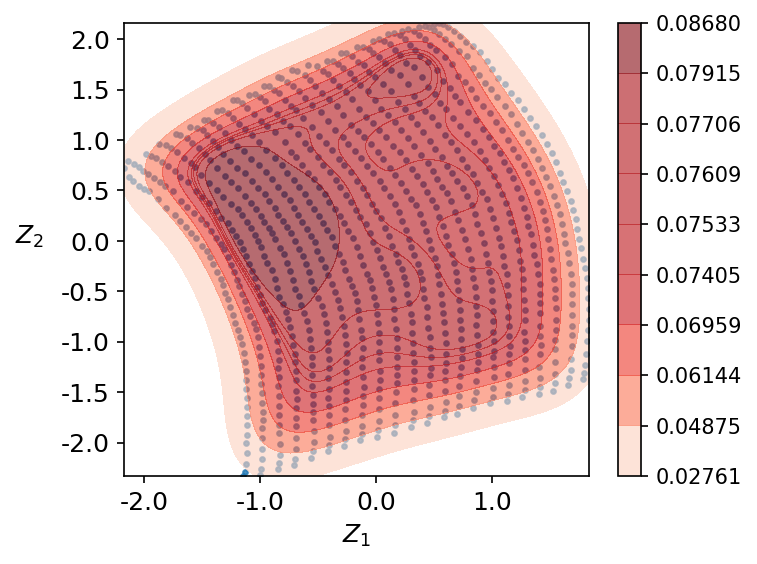

In [ ]:
plt.figure(figsize=(5,4), dpi = 150)
ax = sns.regplot(x=x, y=y, fit_reg = False, scatter_kws={"s": 5})
ax = sns.kdeplot(x=x, y=y, cmap="Reds", shade=True, thresh = 0.05, cut = 0, alpha = 0.6, cbar = True)
ax.set_xlabel(xlabel = '$Z_1$', fontdict={'fontsize' : 12})
ax.set_ylabel(ylabel = '$Z_2$', fontdict={'fontsize' : 12}, rotation = 0, labelpad = 15)
ax.set_xticklabels(np.round(ax.get_xticks(), decimals=2), size = 12)
ax.set_yticklabels(np.round(ax.get_yticks(), decimals=2), size = 12)
ax.figure.axes[-1].yaxis.label.set_size(4)

# ax.set_xlim(-2,2.0)
# ax.set_ylim(-1.5,1.8)

(-2.55, 2.5)

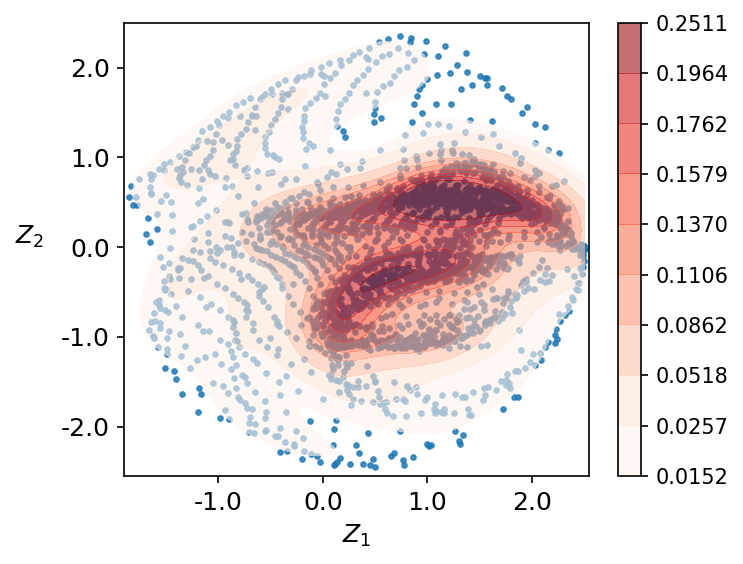

In [ ]:
plt.figure(figsize=(5,4), dpi = 150)
ax = sns.regplot(x=x, y=y, fit_reg = False, scatter_kws={"s": 5})
ax = sns.kdeplot(x=x, y=y, cmap="Reds", shade=True, thresh = 0.05, cut = 0, alpha = 0.6, cbar = True)
ax.set_xlabel(xlabel = '$Z_1$', fontdict={'fontsize' : 12})
ax.set_ylabel(ylabel = '$Z_2$', fontdict={'fontsize' : 12}, rotation = 0, labelpad = 15)
ax.set_xticklabels(np.round(ax.get_xticks(), decimals=2), size = 12)
ax.set_yticklabels(np.round(ax.get_yticks(), decimals=2), size = 12)
ax.figure.axes[-1].yaxis.label.set_size(4)

ax.set_xlim(-1.9,2.55)
ax.set_ylim(-2.55,2.5)

* Data points in both latent dimensions, Z$_1$ and Z$_2$, are well distributed (Z$_1$ and Z$_2$ range across a couple integers in latent space)

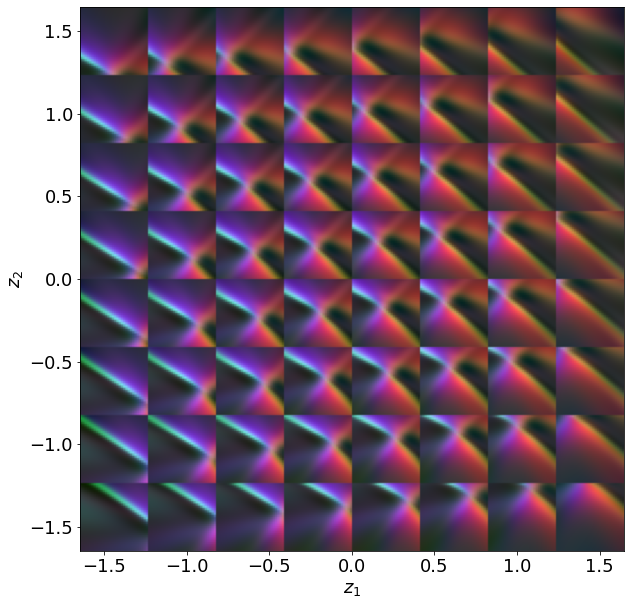

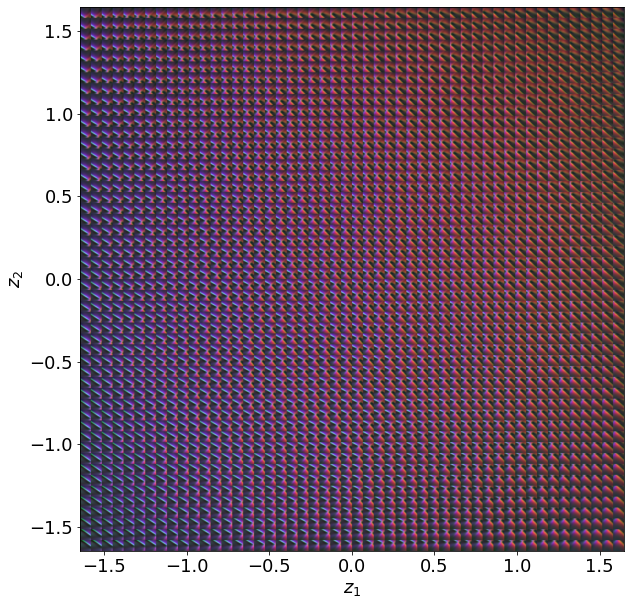

In [ ]:
rvae.manifold2d(d=8);
rvae.manifold2d(d=50);

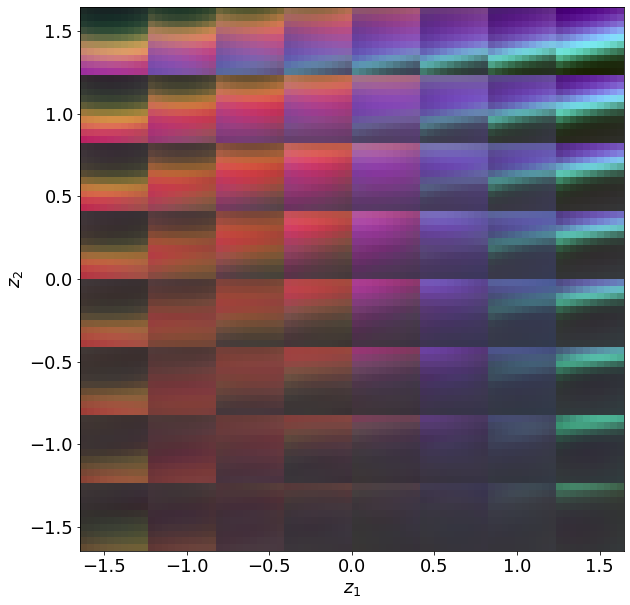

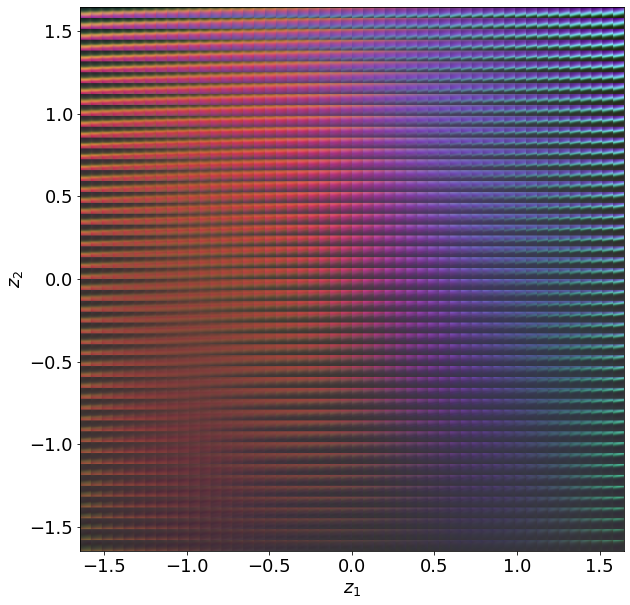

In [ ]:
m1 = rvae.manifold2d(d=8);
m2 = rvae.manifold2d(d=50);

In [ ]:
plt.figure(figsize=(8,8))
ax = plt.gca()
ax.imshow(m1, origin = 'lower')
ax.tick_params(labelsize = 24)
# labels = [item.get_text() for item in ax.get_xticklabels()]
# labels[3] = 'Testing'
labels = np.arange(-1.5,2.0, 0.5)
print(labels)
ax.set_xticklabels(labels);
ax.set_yticklabels(labels);

[Text(0, 0.5, ''), Text(0, 0.5, '')]

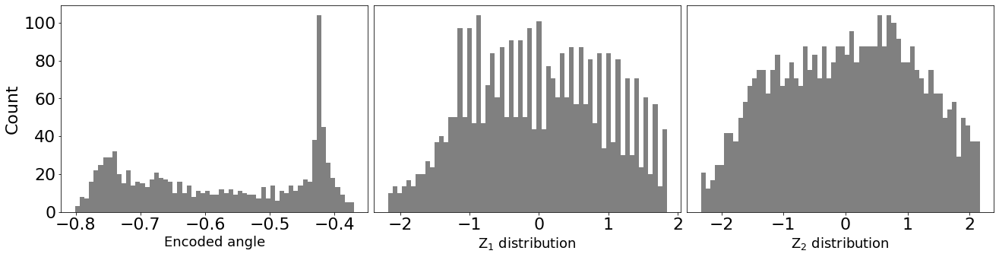

In [ ]:

fig = plt.figure(figsize=(22,5))
gs = gridspec.GridSpec(1,3, wspace = 0.02)
ax1,ax2,ax3 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2])

ax1.hist(z_mean[:,0], bins=60, color='gray')
ax2.hist(z_mean[:, 1], bins=60, color='gray')
ax3.hist(z_mean[:, 2], bins=60, color='gray')
ax1.set_xlabel("Encoded angle", fontsize=18)
ax2.set_xlabel("Z$_1$ distribution", fontsize=18)
ax3.set_xlabel("Z$_2$ distribution", fontsize=18)
for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=22)
    _ax.tick_params(labelsize=22)
    # _ax.set_ylim(0,220)
plt.subplots_adjust(wspace=0.3)

plt.setp([ax2,ax3], yticks=[], ylabel = '')

[]

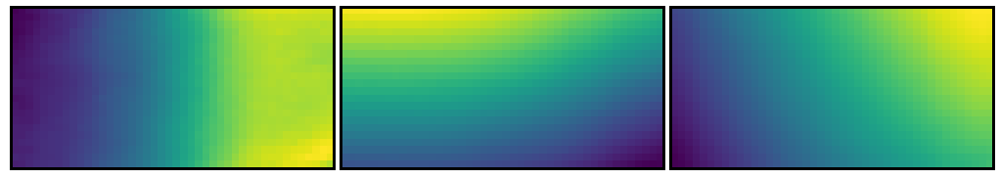

In [ ]:
colormap = 'viridis'
# colormap = 'magma'

fig = plt.figure(figsize=(18,8))
gs = gridspec.GridSpec(1,3, wspace = 0.02)
ax0,ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2])
AngleImage = z_mean[:,0].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage1 = z_mean[:,1].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage2 = z_mean[:,2].reshape(int(d1 - x_window_size),int(d2 - y_window_size))

ax0.imshow(AngleImage, cmap = colormap)
ax1.imshow(LatentImage1, cmap = colormap)
ax2.imshow(LatentImage2, cmap = colormap)

axes = [ax0,ax1,ax2]
for ax in axes:
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.setp(axes,xticks=[],yticks=[])

[]

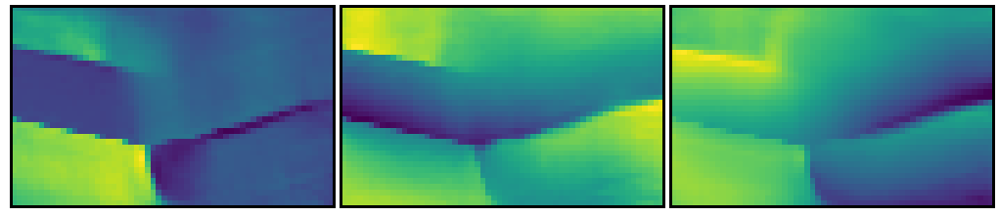

In [ ]:
colormap = 'viridis'
# colormap = 'magma'

fig = plt.figure(figsize=(18,8))
gs = gridspec.GridSpec(1,3, wspace = 0.02)
ax0,ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2])
AngleImage = z_mean[:,0].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage1 = z_mean[:,1].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage2 = z_mean[:,2].reshape(int(d1 - x_window_size),int(d2 - y_window_size))

ax0.imshow(AngleImage, cmap = colormap)
ax1.imshow(LatentImage1, cmap = colormap)
ax2.imshow(LatentImage2, cmap = colormap)

axes = [ax0,ax1,ax2]
for ax in axes:
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.setp(axes,xticks=[],yticks=[])

[]

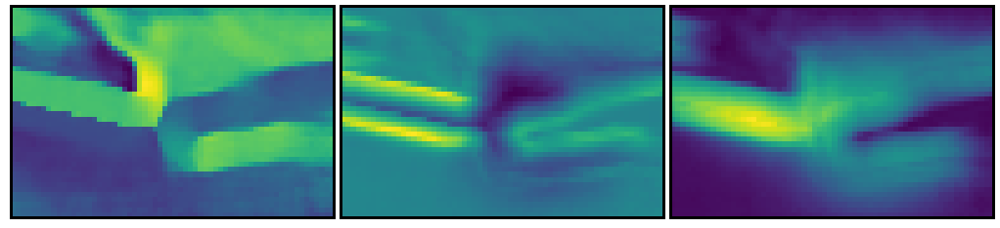

In [ ]:
colormap = 'viridis'
# colormap = 'magma'

fig = plt.figure(figsize=(18,8))
gs = gridspec.GridSpec(1,3, wspace = 0.02)
ax0,ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2])
AngleImage = z_mean[:,0].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage1 = z_mean[:,1].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage2 = z_mean[:,2].reshape(int(d1 - x_window_size),int(d2 - y_window_size))

ax0.imshow(AngleImage, cmap = colormap)
ax1.imshow(LatentImage1, cmap = colormap)
ax2.imshow(LatentImage2, cmap = colormap)

axes = [ax0,ax1,ax2]
for ax in axes:
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.setp(axes,xticks=[],yticks=[])

* DECODE to see reconstruction performance
* Note: There is no original "encoded angle" (which is the first object in z_mean), so we only use the latent features themselves not the encoded angle, hence, z_mean[:,1:] and not the full z_mean

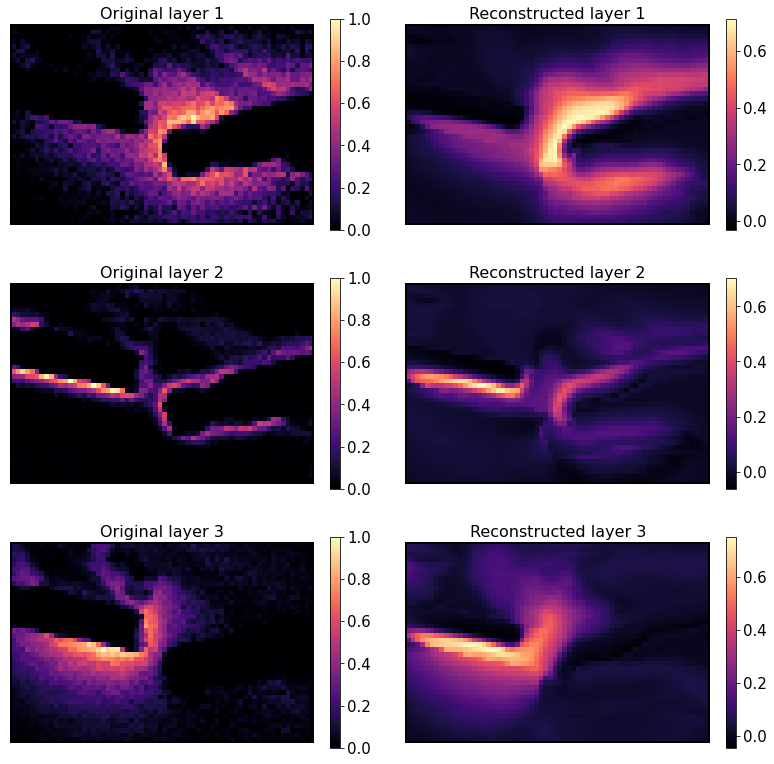

In [ ]:
decoded_arr = rvae.decode(z_mean[:,1:])  
decoded_arr.shape, feature_arr.shape

Origs, Recons = ReconstructCookies(decoded_arr, feature_arr, work_array, average = False)
colormap = Blackbody
colormap = 'magma'

f,ax=plt.subplots(LAYERS,2,figsize=(13,4.5*LAYERS))
if LAYERS > 1:
  for k in range(LAYERS):
    im0 = ax[k,0].imshow(Origs[k], cmap = colormap)
    im1 = ax[k,1].imshow(Recons[k], cmap = colormap)
    ax[k,0].set_title("Original layer {}".format(k+1), fontsize = 16)
    ax[k,1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
    
    cb0 = plt.colorbar(im0, ax=ax[k,0],fraction = 0.032, pad = 0.05)
    cb1 = plt.colorbar(im1, ax=ax[k,1],fraction = 0.032, pad = 0.05)
    cb0.ax.tick_params(labelsize=15)
    cb1.ax.tick_params(labelsize=15)
    plt.setp([ax[k,0],ax[k,1]], xticks=[], yticks=[])
    for axis in ['top','bottom','left','right']:
      ax[k,0].spines[axis].set_linewidth(2)
      ax[k,1].spines[axis].set_linewidth(2)
else:
  for k in range(LAYERS):
    im0 = ax[0].imshow(Origs[k], cmap = colormap)
    im1 = ax[1].imshow(Recons[k], cmap = colormap)
    ax[0].set_title("Original layer {}".format(k+1), fontsize = 16)
    ax[1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
    cb0 = plt.colorbar(im0, ax=ax[0],fraction = 0.032, pad = 0.05)
    cb1 = plt.colorbar(im1, ax=ax[1],fraction = 0.032, pad = 0.05)
    cb0.ax.tick_params(labelsize=15)
    cb1.ax.tick_params(labelsize=15)
    plt.setp([ax[0],ax[1]], xticks=[], yticks=[])
    for axis in ['top','bottom','left','right']:
      ax[0].spines[axis].set_linewidth(2)
      ax[1].spines[axis].set_linewidth(2)

(0.0, 1.0, 0.0, 1.0)

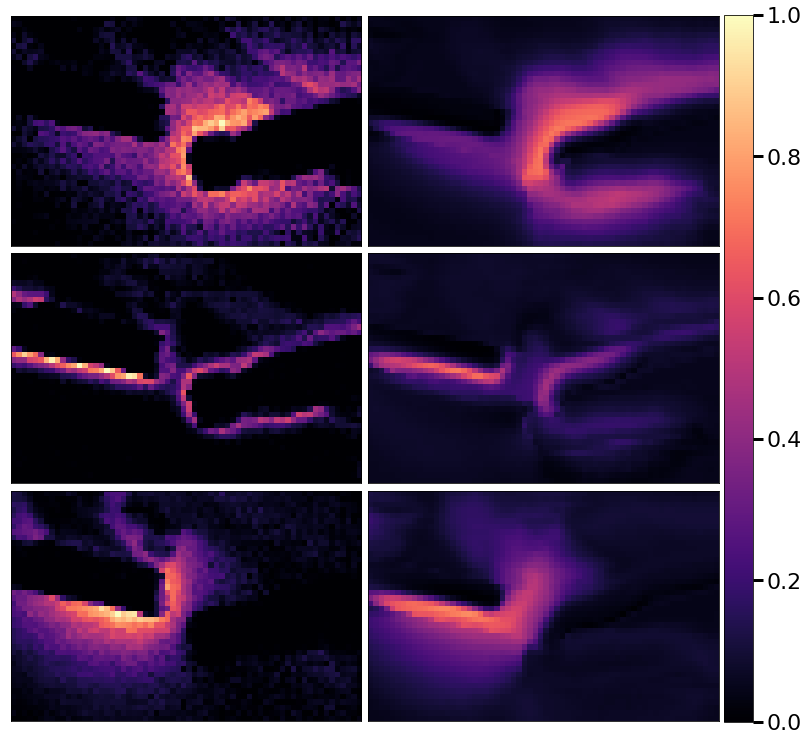

In [ ]:
decoded_arr = rvae.decode(z_mean[:,1:])  
decoded_arr.shape, feature_arr.shape

Origs, Recons = ReconstructCookies(decoded_arr, feature_arr, work_array, average = False)
colormap = Blackbody
colormap = 'magma'

fig = plt.figure(figsize=(13.45,13))
gs = gridspec.GridSpec(3,3,width_ratios=[1,1,0.1], wspace = 0.03, hspace = 0.02)
ax00,ax01 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
ax10,ax11 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1])
ax20,ax21 = plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
caxis = plt.subplot(gs[0:3,2])

im00 = ax00.imshow(Origs[0], cmap = colormap, vmax = 1)
im10 = ax10.imshow(Origs[1], cmap = colormap, vmax = 1)
im20 = ax20.imshow(Origs[2], cmap = colormap, vmax = 1)

im01 = ax01.imshow(Recons[0], cmap = colormap, vmax = 1)
im11 = ax11.imshow(Recons[1], cmap = colormap, vmax = 1)
im21 = ax21.imshow(Recons[2], cmap = colormap, vmax = 1)


cbar = plt.colorbar(im00, ax=caxis, fraction = 1.05, pad = 0.1, aspect = 25)
cbar.ax.tick_params(labelsize=22, size = 10, width = 3)

axes = [ax00,ax01,ax10,ax11,ax20,ax21]
plt.setp(axes,xticks=[],yticks=[])
caxis.axis('off')


# for k in range(LAYERS):
#   im0 = ax.imshow(Origs[k], cmap = colormap, vmax = 1)
#   im1 = ax[k,1].imshow(Recons[k], cmap = colormap, vmax = 1)
#   ax.set_title("Original layer {}".format(k+1), fontsize = 16)
#   ax[k,1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
  
#   cb0 = plt.colorbar(im0, ax=ax,fraction = 0.032, pad = 0.05)
#   cb1 = plt.colorbar(im1, ax=ax[k,1],fraction = 0.032, pad = 0.05)
#   cb0.ax.tick_params(labelsize=15)
#   cb1.ax.tick_params(labelsize=15)
#   plt.setp([ax,ax[k,1]], xticks=[], yticks=[])
#   for axis in ['top','bottom','left','right']:
#     ax.spines[axis].set_linewidth(2)
#     ax[k,1].spines[axis].set_linewidth(2)


(0.0, 1.0, 0.0, 1.0)

<Figure size 968.4x936 with 0 Axes>

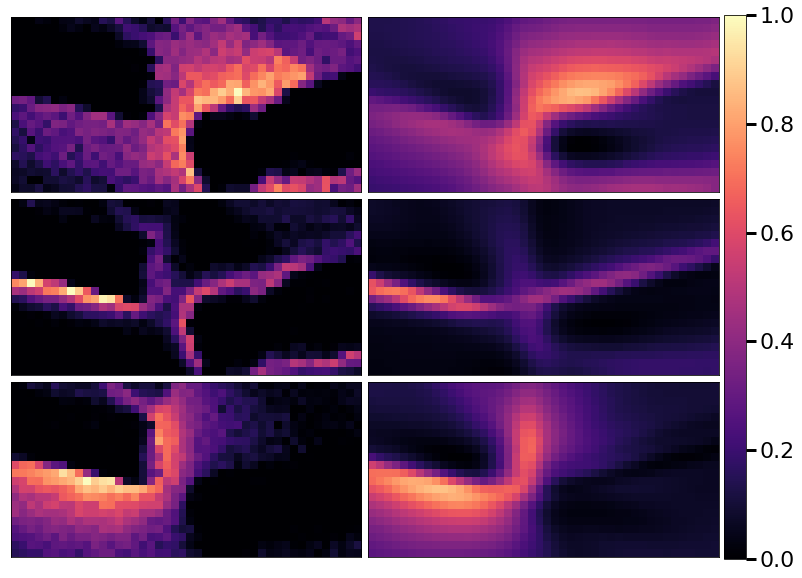

In [ ]:
vmaximum = 1

decoded_arr = rvae.decode(z_mean[:,1:])  
decoded_arr.shape, feature_arr.shape

Origs, Recons = ReconstructCookies(decoded_arr, feature_arr, work_array, average = False)
colormap = Blackbody
colormap = 'magma'

fig = plt.figure(figsize=(13.45,13))

# fig = plt.figure(figsize=(13.45,10))

gs = gridspec.GridSpec(3,3,width_ratios=[1,1,0.1], wspace = 0.03, hspace = 0.02)
ax00,ax01 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
ax10,ax11 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1])
ax20,ax21 = plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
caxis = plt.subplot(gs[0:3,2])

im00 = ax00.imshow(Origs[0], cmap = colormap, vmax = vmaximum)
im10 = ax10.imshow(Origs[1], cmap = colormap, vmax = vmaximum)
im20 = ax20.imshow(Origs[2], cmap = colormap, vmax = vmaximum)

im01 = ax01.imshow(Recons[0], cmap = colormap, vmax = vmaximum)
im11 = ax11.imshow(Recons[1], cmap = colormap, vmax = vmaximum)
im21 = ax21.imshow(Recons[2], cmap = colormap, vmax = vmaximum)


cbar = plt.colorbar(im00, ax=caxis, fraction = 1.05, pad = 0.1, aspect = 25)
cbar.ax.tick_params(labelsize=22, size = 10, width = 3)

axes = [ax00,ax01,ax10,ax11,ax20,ax21]
plt.setp(axes,xticks=[],yticks=[])
caxis.axis('off')


# for k in range(LAYERS):
#   im0 = ax.imshow(Origs[k], cmap = colormap, vmax = 1)
#   im1 = ax[k,1].imshow(Recons[k], cmap = colormap, vmax = 1)
#   ax.set_title("Original layer {}".format(k+1), fontsize = 16)
#   ax[k,1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
  
#   cb0 = plt.colorbar(im0, ax=ax,fraction = 0.032, pad = 0.05)
#   cb1 = plt.colorbar(im1, ax=ax[k,1],fraction = 0.032, pad = 0.05)
#   cb0.ax.tick_params(labelsize=15)
#   cb1.ax.tick_params(labelsize=15)
#   plt.setp([ax,ax[k,1]], xticks=[], yticks=[])
#   for axis in ['top','bottom','left','right']:
#     ax.spines[axis].set_linewidth(2)
#     ax[k,1].spines[axis].set_linewidth(2)


### 9 channels
* Let us repeat the multichannel method but this time using nine channels instead of only 3. 
* Effectively this will capture more of the signal's spectral (and spatial) variability

In [ ]:
comps = 0,1,2,3,4,5,6,7,8

LATENT = 2
LAYERS = len(comps)

EPOCHS = 200

winsize = 10   # Ideally should be commensurate with general size of the features (in pixels)

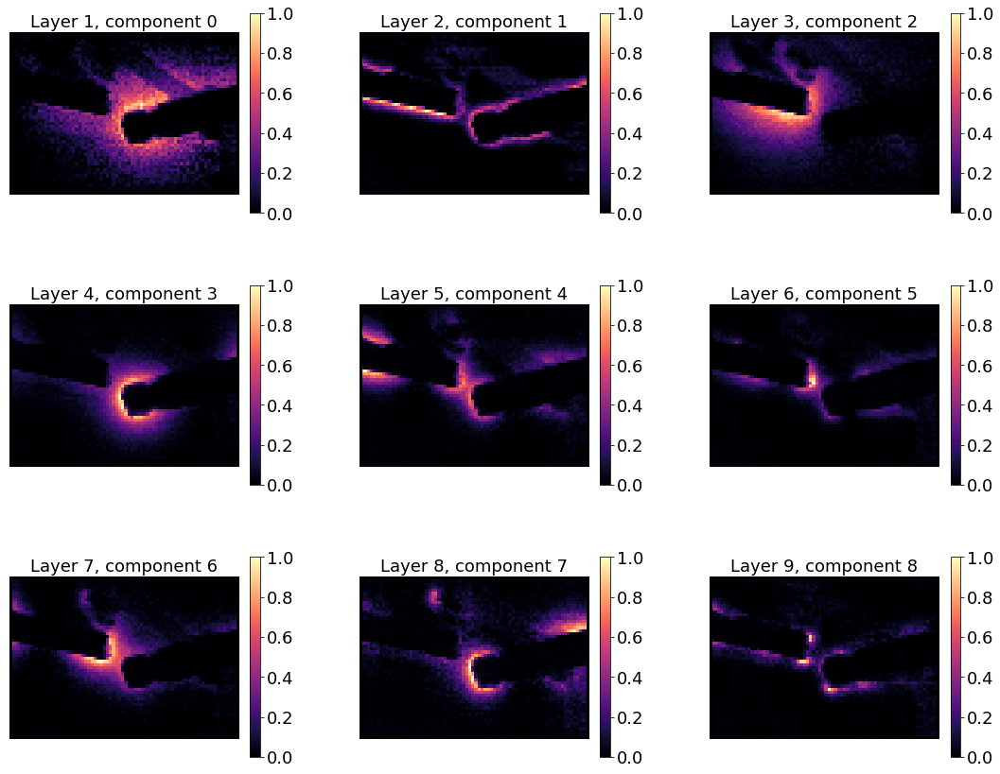

In [ ]:
# Reshaping arrays
work_array_ = X_vec_t_selected.reshape(d1, d2, len(Selected_NMF))
work_array = np.stack((work_array_[:,:,comps[0]], 
                       work_array_[:,:,comps[1]], 
                       work_array_[:,:,comps[2]],
                       work_array_[:,:,comps[3]], 
                       work_array_[:,:,comps[4]], 
                       work_array_[:,:,comps[5]],
                       work_array_[:,:,comps[6]], 
                       work_array_[:,:,comps[7]], 
                       work_array_[:,:,comps[8]],
                       ),axis=2)
if len(work_array.shape) == 2:
  work_array = work_array.reshape((work_array.shape[0], work_array.shape[1],1))


# Normalize layers individually
for k in range(work_array.shape[2]):
  work_array[:,:,k] = normalize(work_array[:,:,k])


# Show input layers
rows = int(np.ceil(LAYERS/3))
cols = int(np.ceil(LAYERS/rows))

gs = gridspec.GridSpec(rows, cols, wspace = 0.4)
fig = plt.figure(figsize = (6*cols, 5*rows))

for k in range(LAYERS):
    ax = fig.add_subplot(gs[k])
    im = ax.imshow(work_array[:,:,k], cmap=colormap)
    for axis in ['top','bottom','left','right']:
      ax.spines[axis].set_linewidth(3)
    plt.setp(ax,xticks=[],yticks=[])
    ax.set_title('Layer {}, component {}'.format(k+1, k), fontsize = 18)
    cb = plt.colorbar(im, ax=ax, fraction = 0.04, pad = 0.05)
    cb.ax.tick_params(labelsize=18) 

In [ ]:
x_window_size = winsize
y_window_size = winsize

# Array to store cookies
feature_arr = np.expand_dims(np.zeros((x_window_size, y_window_size, LAYERS)),axis = 0)
info_arr= np.zeros((2))

for i in range(int(x_window_size/2), int(d1 - x_window_size/2), 1):
  for j in range(int(y_window_size/2), int(d2 - y_window_size/2), 1):
    arr_loc  = MakeLayeredCookie(work_array, i, j, x_window_size, y_window_size) 
    feature_arr = np.append(feature_arr, arr_loc, axis = 0)
    info_arr = np.column_stack((info_arr, (i,j)))

info_arr = info_arr[:,1:].T
feature_arr = feature_arr[1:,:,:,:]
feature_arr.shape

(2688, 10, 10, 9)

In [ ]:
in_dim = (x_window_size, y_window_size, LAYERS)

anneal_dict = {"kl_im": np.linspace(1, 5, 200),
               "kl_rot": np.linspace(2, 20, 200)}

rvae = None
rvae = aoi.models.rVAE(in_dim, translation = False, latent_dim=LATENT)
rvae.fit(feature_arr, anneal_dict = anneal_dict, training_cycles=EPOCHS, random_state = 42,
         capacity = [5, 10, 1])

Epoch: 1/200, Training loss: 21.6535
Epoch: 2/200, Training loss: 8.8993
Epoch: 3/200, Training loss: 8.0026
Epoch: 4/200, Training loss: 7.5140
Epoch: 5/200, Training loss: 7.2028
Epoch: 6/200, Training loss: 6.9730
Epoch: 7/200, Training loss: 6.7979
Epoch: 8/200, Training loss: 6.6754
Epoch: 9/200, Training loss: 6.6835
Epoch: 10/200, Training loss: 6.5533
Epoch: 11/200, Training loss: 6.4853
Epoch: 12/200, Training loss: 6.4185
Epoch: 13/200, Training loss: 6.4555
Epoch: 14/200, Training loss: 6.3668
Epoch: 15/200, Training loss: 6.3274
Epoch: 16/200, Training loss: 6.2999
Epoch: 17/200, Training loss: 6.2211
Epoch: 18/200, Training loss: 6.1620
Epoch: 19/200, Training loss: 6.0204
Epoch: 20/200, Training loss: 5.8421
Epoch: 21/200, Training loss: 5.6449
Epoch: 22/200, Training loss: 5.5353
Epoch: 23/200, Training loss: 5.4945
Epoch: 24/200, Training loss: 5.4051
Epoch: 25/200, Training loss: 5.3528
Epoch: 26/200, Training loss: 5.2380
Epoch: 27/200, Training loss: 5.1810
Epoch: 28

In [ ]:
fname = 'rvae_modelweights_all_9_capacity_5-10-1'  # Choose a filename to save the weights. They can be loaded without training again
rvae.save_weights(fname)
files.download(fname+'.tar')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

* If a model is already trained, we can upload it here, and load it:

In [ ]:
files.upload()

In [ ]:
# uploadedweights = 'rvae_modelweights_all_9.tar'
uploadedweights = 'rvae_modelweights_all_9.tar_capacity_5-10-1'
vae.load_weights(uploadedweights)

* Use rVAE model to extract encoded latent features from the multilayer model
* Note, if more than 2 latent features were used in the model, you may select different latent features to view in 2D.
* Also note that the FIRST "latent" feature when encoding is the "encoded angle", unique to the rVAE

In [ ]:
z_mean, z_sd = rvae.encode(feature_arr)

df = pd.DataFrame(z_mean, columns = ['Encoded Angle', 'Latent 1', 'Latent 2'])

x = df['Latent 1']
y = df['Latent 2']

z_mean.shape

(2688, 3)

* View latent space distribution

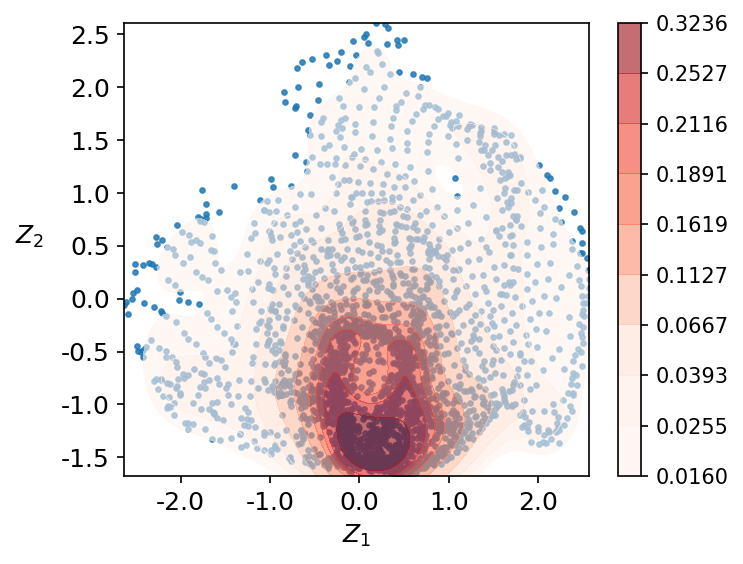

In [ ]:
## Current

plt.figure(figsize=(5,4), dpi = 150)
ax = sns.regplot(x=x, y=y, fit_reg = False, scatter_kws={"s": 5})
ax = sns.kdeplot(x=x, y=y, cmap="Reds", shade=True, thresh = 0.05, cut = 0, alpha = 0.6, cbar = True)
ax.set_xlabel(xlabel = '$Z_1$', fontdict={'fontsize' : 12})
ax.set_ylabel(ylabel = '$Z_2$', fontdict={'fontsize' : 12}, rotation = 0, labelpad = 15)
ax.set_xticklabels(np.round(ax.get_xticks(), decimals=2), size = 12)
ax.set_yticklabels(np.round(ax.get_yticks(), decimals=2), size = 12)
ax.figure.axes[-1].yaxis.label.set_size(4)

* Data points in both latent dimensions, Z$_1$ and Z$_2$, are well distributed (Z$_1$ and Z$_2$ range across a couple integers in latent space)

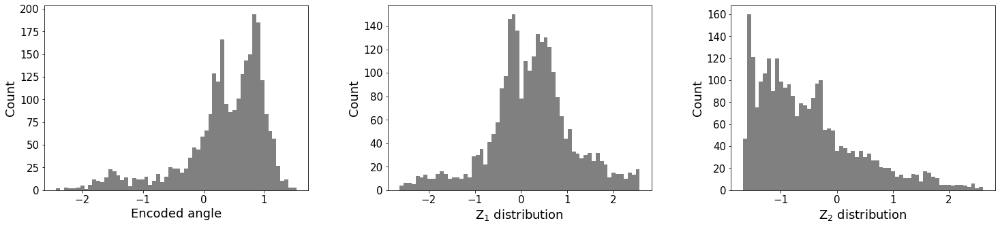

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(25, 5))
ax[0].hist(z_mean[:,0], bins=60, color='gray')


ax[1].hist(z_mean[:, 1], bins=60, color='gray')
ax[2].hist(z_mean[:, 2], bins=60, color='gray')
ax[0].set_xlabel("Encoded angle", fontsize=18)
ax[1].set_xlabel("Z$_1$ distribution", fontsize=18)
ax[2].set_xlabel("Z$_2$ distribution", fontsize=18)
for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=18)
    _ax.tick_params(labelsize=15)
plt.subplots_adjust(wspace=0.3)

[]

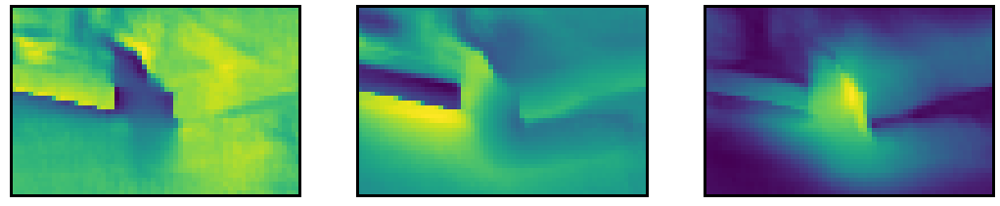

In [ ]:
colormap = 'viridis'

_, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(18,8))

AngleImage = z_mean[:,0].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage1 = z_mean[:,1].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage2 = z_mean[:,2].reshape(int(d1 - x_window_size),int(d2 - y_window_size))

ax0.imshow(AngleImage)
ax1.imshow(LatentImage1)
ax2.imshow(LatentImage2)

axes = [ax0,ax1,ax2]
for ax in axes:
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.setp(axes,xticks=[],yticks=[])

* DECODE to see reconstruction performance
* Note: There is no original "encoded angle" (which is the first object in z_mean), so we only use the latent features themselves not the encoded angle, hence, z_mean[:,1:] and not the full z_mean

In [ ]:
decoded_arr = rvae.decode(z_mean[:,1:])  
decoded_arr.shape, feature_arr.shape

((2688, 10, 10, 9), (2688, 10, 10, 9))

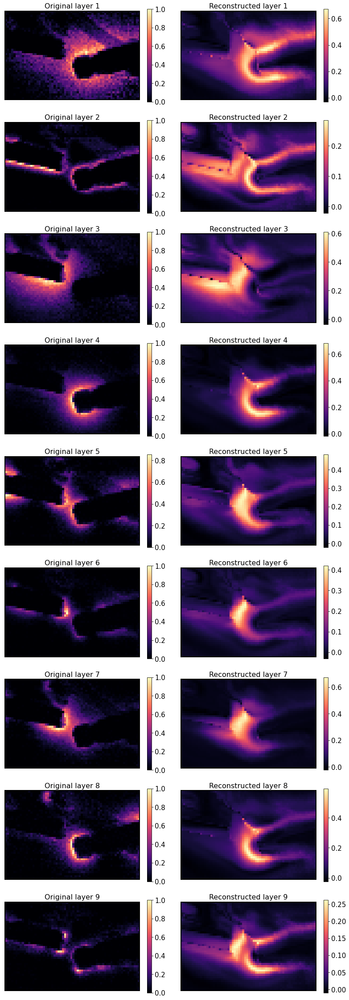

In [ ]:
Origs, Recons = ReconstructCookies(decoded_arr, feature_arr, work_array, average = False)
colormap = 'magma'

f,ax=plt.subplots(LAYERS,2,figsize=(13,4.5*LAYERS))
if LAYERS > 1:
  for k in range(LAYERS):
    im0 = ax[k,0].imshow(Origs[k], cmap = colormap)
    im1 = ax[k,1].imshow(Recons[k], cmap = colormap)
    ax[k,0].set_title("Original layer {}".format(k+1), fontsize = 16)
    ax[k,1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
    
    cb0 = plt.colorbar(im0, ax=ax[k,0],fraction = 0.032, pad = 0.05)
    cb1 = plt.colorbar(im1, ax=ax[k,1],fraction = 0.032, pad = 0.05)
    cb0.ax.tick_params(labelsize=15)
    cb1.ax.tick_params(labelsize=15)
    plt.setp([ax[k,0],ax[k,1]], xticks=[], yticks=[])
    for axis in ['top','bottom','left','right']:
      ax[k,0].spines[axis].set_linewidth(2)
      ax[k,1].spines[axis].set_linewidth(2)
else:
  for k in range(LAYERS):
    im0 = ax[0].imshow(Origs[k], cmap = colormap)
    im1 = ax[1].imshow(Recons[k], cmap = colormap)
    ax[0].set_title("Original layer {}".format(k+1), fontsize = 16)
    ax[1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
    cb0 = plt.colorbar(im0, ax=ax[0],fraction = 0.032, pad = 0.05)
    cb1 = plt.colorbar(im1, ax=ax[1],fraction = 0.032, pad = 0.05)
    cb0.ax.tick_params(labelsize=15)
    cb1.ax.tick_params(labelsize=15)
    plt.setp([ax[0],ax[1]], xticks=[], yticks=[])
    for axis in ['top','bottom','left','right']:
      ax[0].spines[axis].set_linewidth(2)
      ax[1].spines[axis].set_linewidth(2)

# Core loss

* For consistency, repeating analysis here for core-loss set:


In [ ]:
%%capture
!wget https://www.dropbox.com/s/8zieqt6wuofhx3y/coreloss_files.npy
coreloss_file = np.load('coreloss_files.npy', allow_pickle=True).tolist()

In [ ]:
coreloss_file.files

In [ ]:
EELS_data = 'coreloss'  # choose 'lowloss' or 'coreloss'

#############################################################
if EELS_data == "lowloss":
  SI, E = lowloss_file['SI'], lowloss_file['E']
elif EELS_data == "coreloss":
  SI, E, img = coreloss_file['SINB'], coreloss_file['ENB'], coreloss_file['image']

* View the spectrum image averaged over all energy, and the average spectrum over all space


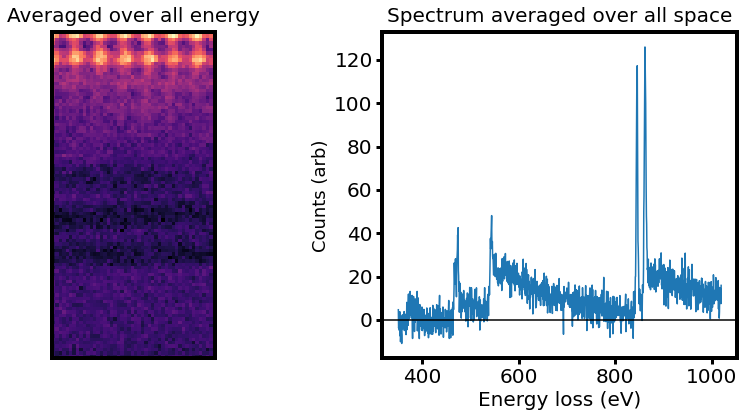

In [ ]:
colormap = Blackbody
colormap = 'magma'

_,ax = plt.subplots(1,2,figsize=(14,6))
avg_img = np.mean(SI,axis=2)
avg_spec = np.mean(SI,axis=(0,1))

ax[0].imshow(avg_img, cmap = colormap)
ax[1].plot(E,avg_spec)
plt.setp(ax[0], xticks=[], yticks=[]);
for axes in ax:
  for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(4)
ax[1].set_xlabel('Energy loss (eV)', fontsize = 20)
ax[1].tick_params(labelsize = 20, length = 6, width = 3)
ax[1].set_ylabel('Counts (arb)', fontsize = 18)
ax[1].axhline(0, color = 'k')

ax[0].set_title('Averaged over all energy',fontsize = 20, pad = 10)
ax[1].set_title('Spectrum averaged over all space',fontsize = 20, pad = 10);

## Linear decomposition (PCA, NMF)

In [ ]:
data = SI
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

* Scree plot to check variance

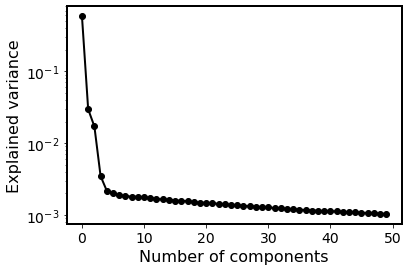

In [ ]:
ax = gca()

pca = decomposition.PCA()
pca.fit(X_vec)
plt.plot(pca.explained_variance_ratio_[0:50], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(2)

plt.yscale('log')

In [ ]:
X_vec = np.copy(SI.reshape((SI.shape[0]*SI.shape[1],SI.shape[2])))
X_vec[np.where(X_vec<0)]=0

* Select number of components (can be based on PCA scree plot) and type of decomposition (PCA or NMF here)

In [ ]:
# Select number of components
nc = 30 

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'NMF'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
    
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(30, 1340) (4608, 30)


View the decomposed spectral components and abundance maps:

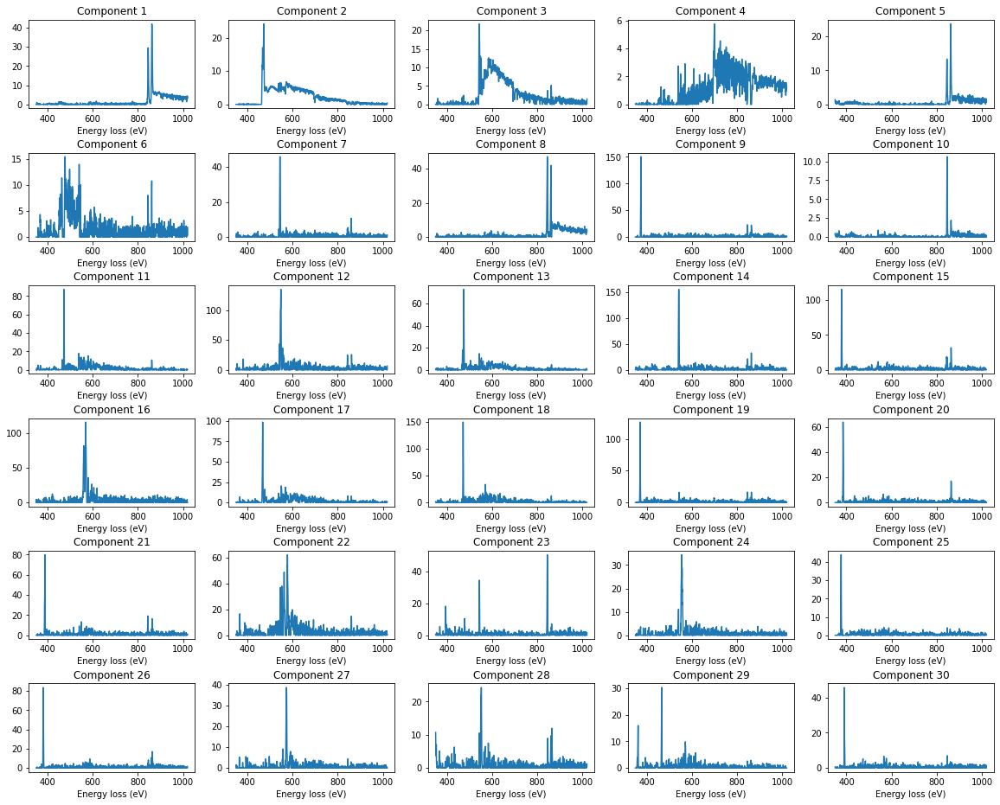

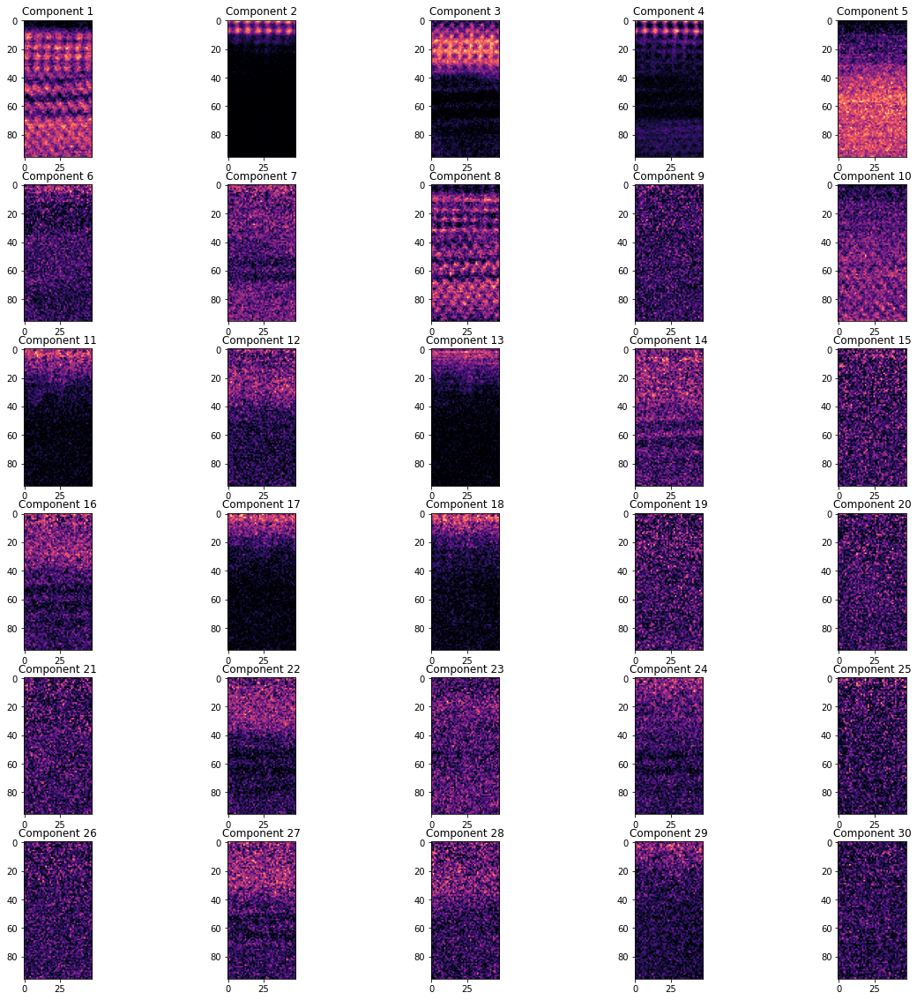

In [ ]:
colormap = Blackbody
colormap = 'magma'

rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

gs1 = gridspec.GridSpec(rows, cols, hspace = 0.5)
fig1 = plt.figure(figsize = (4*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(E,components[i])
    ax1.set_xlabel('Energy loss (eV)')
    ax1.set_title('Component ' + str(i + 1))

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = colormap)
    ax2.set_title('Component ' + str(i + 1))

* For multilayer rVAE, we will need to **select the components** (specifically, the abundance maps) with which we want to analyze.
* (These will be used later in the <u>Multilayer rVAE</u> section)
* For instance:

In [ ]:
# Selected_decomped_ims = [0,1,2,3]
Selected_decomped_ims = [0,1,2,3,7]

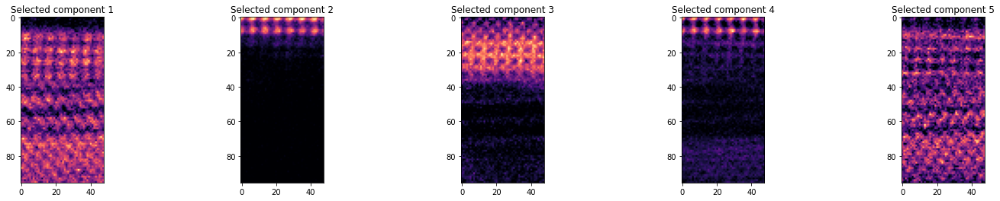

In [ ]:
colormap = Blackbody
colormap = 'magma'

layers = len(Selected_decomped_ims)
X_vec_t_selected = np.zeros((X_vec_t.shape[0], layers))
for k in range(layers):
  X_vec_t_selected[:,k] = X_vec_t[:,Selected_decomped_ims[k]]

rows = int(np.ceil(float(layers)/5))
cols = int(np.ceil(float(layers)/rows))
gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (5*cols, 4*rows))   
for i in range(layers):
    ax = fig.add_subplot(gs[i])
    ax.imshow(X_vec_t_selected[:, i].reshape(d1, d2), cmap = colormap)
    ax.set_title('Selected component ' + str(i + 1))

## 1D VAE

Prepare the data
  * subtract average spectrum from all pixels
  * normalize to [0,1] 

In [ ]:
subtract_average = False
normalized = True

work_array = data.copy()
d1, d2, d3 = work_array.shape

X_train = work_array.reshape(d1 * d2, d3)

if subtract_average:
  X_train = X_train - X_train.mean(axis = 0)

if normalized: 
  X_train = normalize(X_train)

X_train = np.expand_dims(X_train, axis = 2)
print(X_train.shape)

(4608, 1340, 1)


* Select number of:
  * Latent dimensions, note if 2 dims, we can visualize the latent manifold in 2D
  * training cycles (aka epochs, several hundred are typically sufficient - depends on loss minimization)

In [ ]:
LATENT = 2
EPOCHS = 400

input_dim = (X_train.shape[1], 1)

# Intitialize model
vae = aoi.models.VAE(input_dim, latent_dim=LATENT, 
                        numlayers_encoder=3, numhidden_encoder=512,
                        numlayers_decoder=3, numhidden_decoder=512,
                        skip=False, random_state = 42) 
# Train
vae.fit(X_train, training_cycles=EPOCHS, batch_size=32, loss="mse",
        capacity = [10, 100, 1])

Epoch: 1/400, Training loss: 2.5086
Epoch: 2/400, Training loss: 0.5681
Epoch: 3/400, Training loss: 0.3876
Epoch: 4/400, Training loss: 0.3502
Epoch: 5/400, Training loss: 0.3358
Epoch: 6/400, Training loss: 0.3164
Epoch: 7/400, Training loss: 0.3474
Epoch: 8/400, Training loss: 0.3039
Epoch: 9/400, Training loss: 0.3085
Epoch: 10/400, Training loss: 0.3116
Epoch: 11/400, Training loss: 0.3047
Epoch: 12/400, Training loss: 0.3010
Epoch: 13/400, Training loss: 0.2956
Epoch: 14/400, Training loss: 0.2890
Epoch: 15/400, Training loss: 0.2884
Epoch: 16/400, Training loss: 0.2871
Epoch: 17/400, Training loss: 0.2800
Epoch: 18/400, Training loss: 0.2873
Epoch: 19/400, Training loss: 0.2838
Epoch: 20/400, Training loss: 0.2858
Epoch: 21/400, Training loss: 0.2858
Epoch: 22/400, Training loss: 0.2782
Epoch: 23/400, Training loss: 0.2842
Epoch: 24/400, Training loss: 0.2803
Epoch: 25/400, Training loss: 0.2720
Epoch: 26/400, Training loss: 0.2735
Epoch: 27/400, Training loss: 0.2714
Epoch: 28/

In [ ]:
fname = 'VAE_modelweights_coreloss_cap10-100-1_FIXED_noavgsubtract'  # Choose a filename to save the weights. They can be loaded without training again
vae.save_weights(fname)
files.download(fname+'.tar')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

* If a model is already trained, we can upload it here, and load it:

In [ ]:
files.upload()

In [ ]:
uploadedweights = 'VAE_modelweights_coreloss_cap10-100-1_FIXED_noavgsubtract'
vae.load_weights(uploadedweights)

* Use VAE model to extract encoded latent features
* Note, if more than 2 latent features were used in the model, you may select different latent features to view in 2D.

In [ ]:
z_mean, z_sd = vae.encode(X_train)

df = pd.DataFrame(z_mean, columns = ['Latent 1', 'Latent 2'])

x = df['Latent 1']
y = df['Latent 2']

z_mean.shape

(4608, 2)

* View latent space distribution

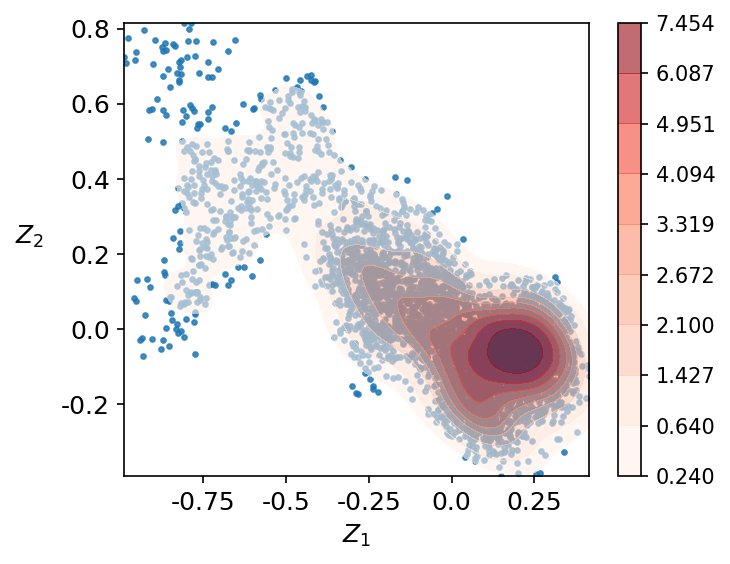

In [ ]:
plt.figure(figsize=(5,4), dpi = 150)
ax = sns.regplot(x=x, y=y, fit_reg = False, scatter_kws={"s": 5})
ax = sns.kdeplot(x=x, y=y, cmap="Reds", shade=True, thresh = 0.05, cut = 0, alpha = 0.6, cbar = True)
ax.set_xlabel(xlabel = '$Z_1$', fontdict={'fontsize' : 12})
ax.set_ylabel(ylabel = '$Z_2$', fontdict={'fontsize' : 12}, rotation = 0, labelpad = 15)
ax.set_xticklabels(np.round(ax.get_xticks(), decimals=2), size = 12)
ax.set_yticklabels(np.round(ax.get_yticks(), decimals=2), size = 12)
ax.figure.axes[-1].yaxis.label.set_size(4)

* Collect the encoded latent features and project them into original 2D space

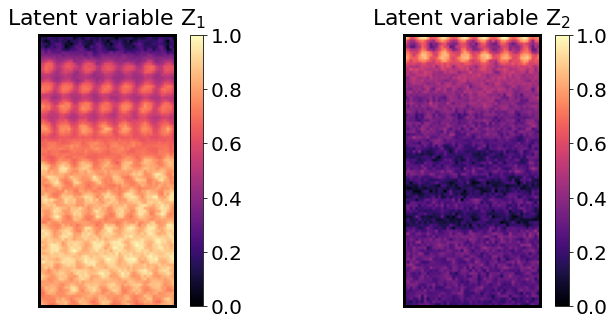

In [ ]:
colormap = Blackbody  # Select a colormap
colormap = 'magma'
latent_maps = []

for k in range(z_mean.shape[1]):
  latent_maps.append(normalize(z_mean[:,k].reshape(d1,d2)))

rows = int(np.ceil(float(LATENT)/3))
cols = int(np.ceil(float(LATENT)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 5*(rows)))   
for k in range(len(latent_maps)):
  ax = fig.add_subplot(gs[k])
  im = ax.imshow(latent_maps[k], cmap = colormap)
  ax.set_title("Latent variable Z$_{}$".format(k+1), fontsize = 22, pad = 10)
  for borders in ['top','bottom','left','right']:
    ax.spines[borders].set_linewidth(3)
    ax.spines[borders].set_color('k')
    ax.set_xticks([]), ax.set_yticks([])
  cb = plt.colorbar(im, ax=ax, fraction = 0.046, pad = 0.05)
  cb.ax.tick_params(labelsize=20) 

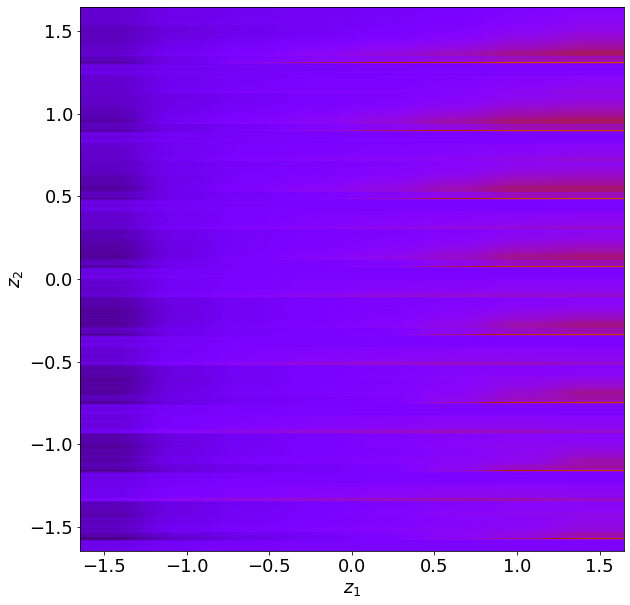

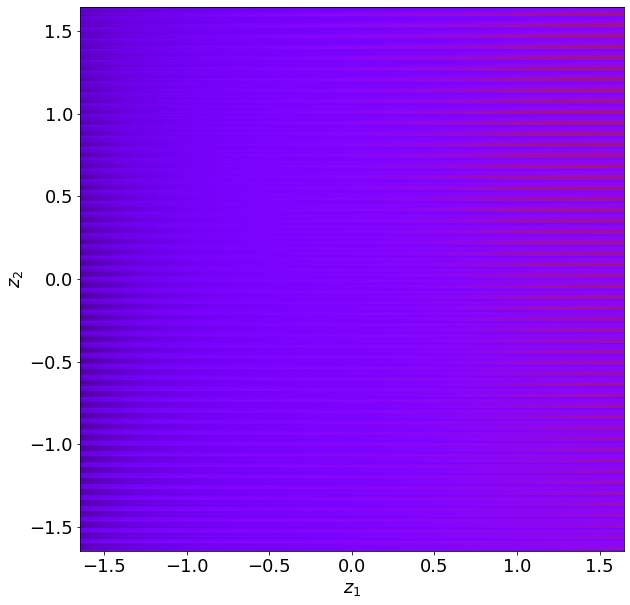

In [ ]:
m1 = vae.manifold2d(d=8);
m2 = vae.manifold2d(d=50);

* Observe the reconstruction performance and mean squared error (MSE) loss compared to the original data

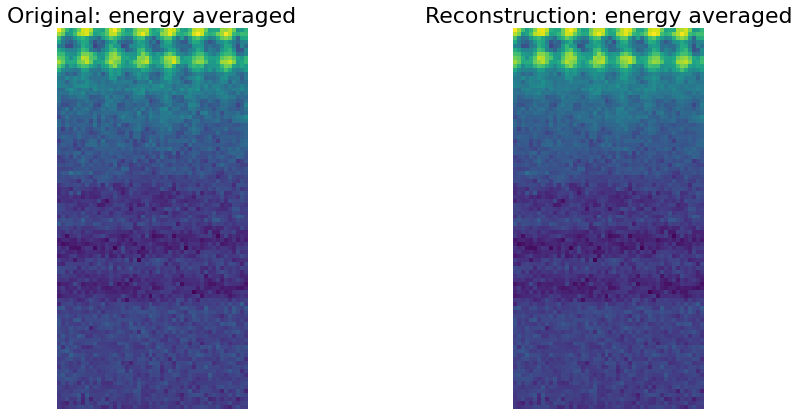

In [ ]:
colormap = Blackbody
colormap = 'magma'
colormap = 'viridis'

original_data = X_train.reshape(d1,d2,d3)
encoded_data = np.copy(z_mean)
reconstructed_ = vae.decode(z_mean[:,:])
reconstructed = np.reshape(reconstructed_, (d1,d2,d3))

reconstructed_mean = normalize(np.mean(reconstructed,axis=2))
original_mean = normalize(np.mean(original_data,axis=2))

fig,ax = plt.subplots(1,2,figsize=(15,7))
ax[0].imshow(original_mean, cmap = colormap)
ax[1].imshow(reconstructed_mean, cmap = colormap)
ax[0].set_title("Original: energy averaged", fontsize = 22)
ax[1].set_title("Reconstruction: energy averaged", fontsize = 22)
ax[0].axis('off'),ax[1].axis('off');

Get the Error:

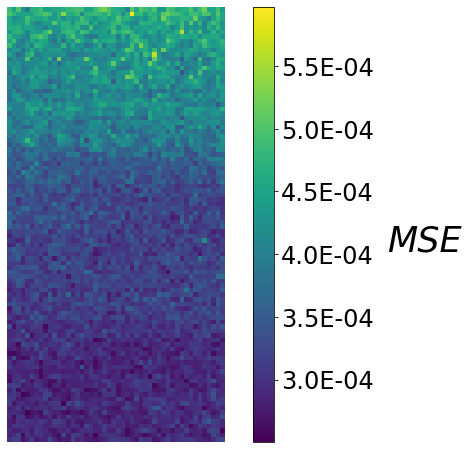

In [ ]:
colormap = Blackbody
colormap = 'viridis'

errormap = np.zeros( reconstructed.shape[0:2] )
for ii in range(errormap.shape[0]):
  for jj in range(errormap.shape[1]):
    errormap[ii,jj] = MSE(original_data[ii,jj], reconstructed[ii,jj])

_,ax = plt.subplots(1,figsize=(10,8))
im = ax.imshow(errormap, cmap = colormap)
ax.axis('off')
cb = plt.colorbar(im, ax=ax, fraction = 0.045, pad = 0.05,format ="%.1E")
cb.ax.tick_params(labelsize=24) 
cb.set_label("MSE", style = "italic", labelpad = 50, size = 35, rotation = 0)

# ax.scatter(125,2, c='r', s=100, alpha = 0.5)

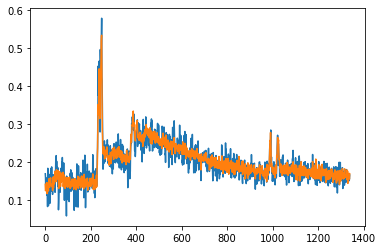

In [ ]:
i,j = 5,5

plt.plot(original_data[i,j])
plt.plot(reconstructed[i,j])

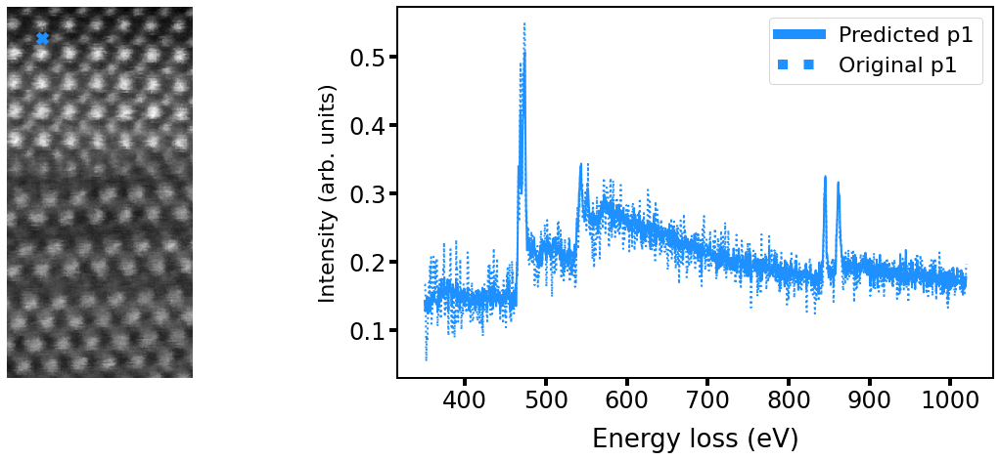

In [ ]:
ii=0

selected_points = [(8,9),
                   (28, 30),
                   (72,30)]
Colors = ['dodgerblue', 'darkorange']

fig = plt.figure(figsize=(20,7))
gs = gridspec.GridSpec(1,2, width_ratios=[1,1.5])
ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

ax1.imshow(img, cmap ='gray')
ax1.axis('off')

ax2.set_xlabel('Energy loss (eV)', fontsize = 26, labelpad = 15)
ax2.set_ylabel('Intensity (arb. units)', fontsize = 22, labelpad = 10)

ax2.plot(E, reconstructed[selected_points[ii]], label = 'Predicted p{}'.format(ii+1), lw = 2, color=Colors[ii])
ax2.plot(E, original_data[selected_points[ii]], label = 'Original p{}'.format(ii+1), lw = 2, ls='dotted', color=Colors[ii])
# ax1.scatter(p[1], p[0], c='r', s=150, marker = 'X')
ax1.scatter(int(selected_points[ii][1]*r1), int(selected_points[ii][0]*r2), c=Colors[ii], s=150, marker = 'X')


ax2.tick_params(labelsize = 24, length = 8, width = 4)

leg = ax2.legend(fontsize=22)
for line in leg.get_lines():
    line.set_linewidth(10)

for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(2)

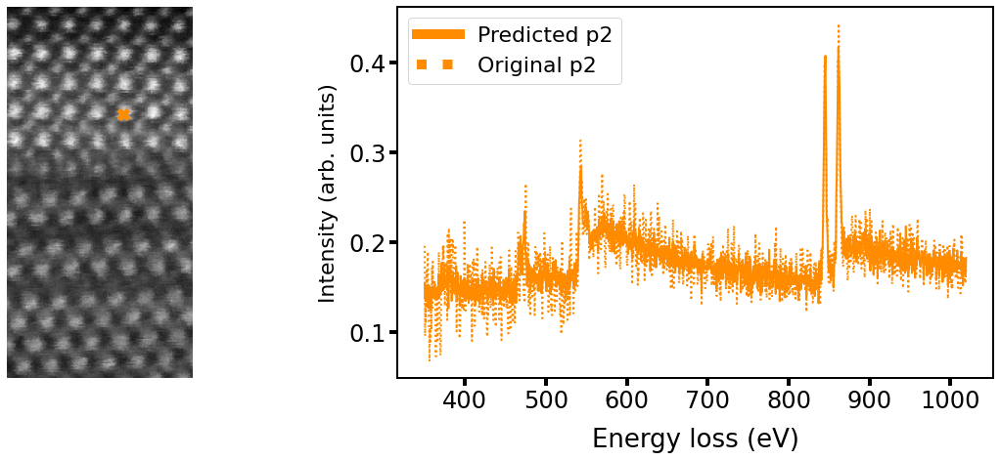

In [ ]:
ii=1

selected_points = [(8,9),
                   (28, 30),
                   (72,30)]
Colors = ['dodgerblue', 'darkorange']

fig = plt.figure(figsize=(20,7))
gs = gridspec.GridSpec(1,2, width_ratios=[1,1.5])
ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

ax1.imshow(img, cmap ='gray')
ax1.axis('off')

ax2.set_xlabel('Energy loss (eV)', fontsize = 26, labelpad = 15)
ax2.set_ylabel('Intensity (arb. units)', fontsize = 22, labelpad = 10)

ax2.plot(E, reconstructed[selected_points[ii]], label = 'Predicted p{}'.format(ii+1), lw = 2, color=Colors[ii])
ax2.plot(E, original_data[selected_points[ii]], label = 'Original p{}'.format(ii+1), lw = 2, ls='dotted', color=Colors[ii])
# ax1.scatter(p[1], p[0], c='r', s=150, marker = 'X')
ax1.scatter(int(selected_points[ii][1]*r1), int(selected_points[ii][0]*r2), c=Colors[ii], s=150, marker = 'X')


ax2.tick_params(labelsize = 24, length = 8, width = 4)

leg = ax2.legend(fontsize=22)
for line in leg.get_lines():
    line.set_linewidth(10)

for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(2)

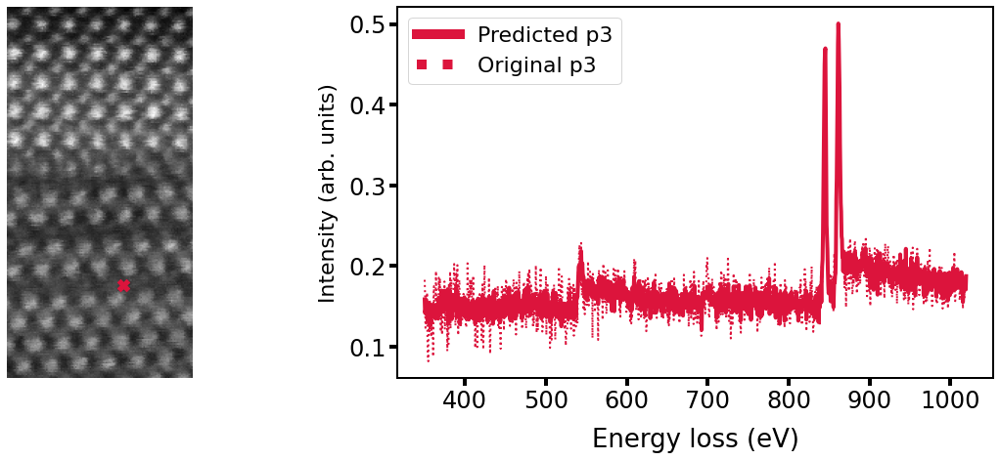

In [ ]:
ii=2

selected_points = [(8,9),
                   (28, 30),
                   (72,30)]
Colors = ['dodgerblue', 'darkorange', 'crimson']

fig = plt.figure(figsize=(20,7))
gs = gridspec.GridSpec(1,2, width_ratios=[1,1.5])
ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

ax1.imshow(img, cmap ='gray')
ax1.axis('off')

ax2.set_xlabel('Energy loss (eV)', fontsize = 26, labelpad = 15)
ax2.set_ylabel('Intensity (arb. units)', fontsize = 22, labelpad = 10)

ax2.plot(E, reconstructed[selected_points[ii]], label = 'Predicted p{}'.format(ii+1), lw = 4, color=Colors[ii])
ax2.plot(E, original_data[selected_points[ii]], label = 'Original p{}'.format(ii+1), lw = 2, ls='dotted', color=Colors[ii])
# ax1.scatter(p[1], p[0], c='r', s=150, marker = 'X')
ax1.scatter(int(selected_points[ii][1]*r1), int(selected_points[ii][0]*r2), c=Colors[ii], s=150, marker = 'X')


ax2.tick_params(labelsize = 24, length = 8, width = 4)

leg = ax2.legend(fontsize=22)
for line in leg.get_lines():
    line.set_linewidth(10)

for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(2)

## *** Multichannel rVAE (atomic core-loss) ***

* Here we use our domain expertise (bias) to select the "best" NMF abundance maps to the rVAE model.
* "Best" here is defined as what features we are most interested in! So **this allows one to specifically choose the spectral features that we are most interested in** and see how they impact the system and data.
* This ordering is more critical for the fewer number of channels (i.e., 3)
* We explore using individually normalized channels, still.

### 3 channels
* Now we will use the decomposed abundance maps from NMF earlier.
* Let's recall the selected channels, and further down-select for the features of interest to us:

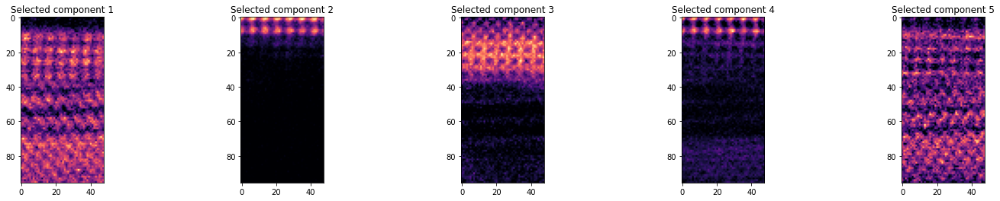

In [ ]:
colormap = Blackbody
colormap = 'magma'

layers = len(Selected_decomped_ims)
X_vec_t_selected = np.zeros((X_vec_t.shape[0], layers))
for k in range(layers):
  X_vec_t_selected[:,k] = X_vec_t[:,Selected_decomped_ims[k]]

rows = int(np.ceil(float(layers)/5))
cols = int(np.ceil(float(layers)/rows))
gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (5*cols, 4*rows))   
for i in range(layers):
    ax = fig.add_subplot(gs[i])
    ax.imshow(X_vec_t_selected[:, i].reshape(d1, d2), cmap = colormap)
    ax.set_title('Selected component ' + str(i + 1))

* First three of these look reasonable, 
* but we may select different layers, or increase number of layers
* Also, may adjust # latent dimensions
  * using 2 has the benefit of visualizing the latent manifold in 2D

In [ ]:
comps = 0,1,2

LATENT = 2
LAYERS = len(comps)

EPOCHS = 200

winsize = 6   # Ideally should be commensurate with general size of the features (in pixels)

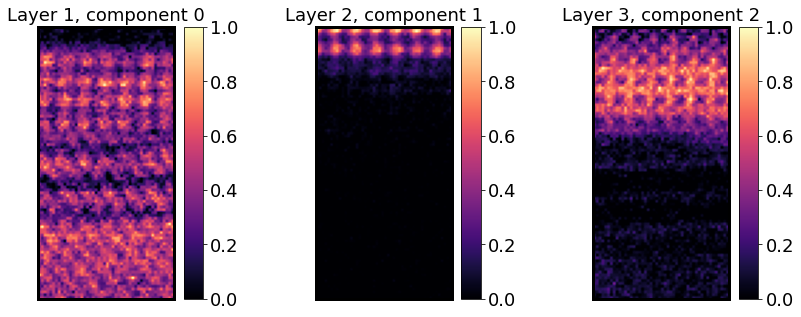

In [ ]:
# Reshaping arrays
work_array_ = X_vec_t_selected.reshape(d1, d2, len(Selected_decomped_ims))
work_array = np.stack((work_array_[:,:,comps[0]], 
                       work_array_[:,:,comps[1]], 
                       work_array_[:,:,comps[2]]
                       ),axis=2)
if len(work_array.shape) == 2:
  work_array = work_array.reshape((work_array.shape[0], work_array.shape[1],1))


# Normalize layers individually
for k in range(work_array.shape[2]):
  work_array[:,:,k] = normalize(work_array[:,:,k])


# Show input layers
rows = int(np.ceil(LAYERS/3))
cols = int(np.ceil(LAYERS/rows))

gs = gridspec.GridSpec(rows, cols, wspace = 0.4)
fig = plt.figure(figsize = (4.5*cols, 5*rows))

for k in range(LAYERS):
    ax = fig.add_subplot(gs[k])
    im = ax.imshow(work_array[:,:,k], cmap=colormap)
    for axis in ['top','bottom','left','right']:
      ax.spines[axis].set_linewidth(3)
    plt.setp(ax,xticks=[],yticks=[])
    ax.set_title('Layer {}, component {}'.format(k+1, k), fontsize = 18)
    cb = plt.colorbar(im, ax=ax, fraction = 0.1, pad = 0.05, aspect = 14)
    cb.ax.tick_params(labelsize=18) 

In [ ]:
x_window_size = winsize
y_window_size = winsize

# Array to store cookies
feature_arr = np.expand_dims(np.zeros((x_window_size, y_window_size, LAYERS)),axis = 0)
info_arr= np.zeros((2))

for i in range(int(x_window_size/2), int(d1 - x_window_size/2), 1):
  for j in range(int(y_window_size/2), int(d2 - y_window_size/2), 1):
    arr_loc  = MakeLayeredCookie(work_array, i, j, x_window_size, y_window_size) 
    feature_arr = np.append(feature_arr, arr_loc, axis = 0)
    info_arr = np.column_stack((info_arr, (i,j)))

info_arr = info_arr[:,1:].T
feature_arr = feature_arr[1:,:,:,:]
feature_arr.shape

(3780, 6, 6, 3)

In [ ]:
in_dim = (x_window_size, y_window_size, LAYERS)

anneal_dict = {"kl_im": np.linspace(1, 5, 200),
               "kl_rot": np.linspace(2, 20, 200)}

rvae = aoi.models.rVAE(in_dim, translation = False, latent_dim=LATENT)
rvae.fit(feature_arr, anneal_dict = anneal_dict, training_cycles=EPOCHS, capacity = [10,100,1])

Epoch: 1/200, Training loss: 10.5700
Epoch: 2/200, Training loss: 2.6252
Epoch: 3/200, Training loss: 2.5966
Epoch: 4/200, Training loss: 2.5012
Epoch: 5/200, Training loss: 2.4261
Epoch: 6/200, Training loss: 2.0635
Epoch: 7/200, Training loss: 1.7102
Epoch: 8/200, Training loss: 1.5156
Epoch: 9/200, Training loss: 1.4346
Epoch: 10/200, Training loss: 1.4060
Epoch: 11/200, Training loss: 1.4035
Epoch: 12/200, Training loss: 1.4098
Epoch: 13/200, Training loss: 1.3660
Epoch: 14/200, Training loss: 1.3256
Epoch: 15/200, Training loss: 1.3235
Epoch: 16/200, Training loss: 1.1861
Epoch: 17/200, Training loss: 1.0684
Epoch: 18/200, Training loss: 1.0532
Epoch: 19/200, Training loss: 0.9794
Epoch: 20/200, Training loss: 1.0473
Epoch: 21/200, Training loss: 1.0214
Epoch: 22/200, Training loss: 0.9851
Epoch: 23/200, Training loss: 0.9406
Epoch: 24/200, Training loss: 0.9263
Epoch: 25/200, Training loss: 0.9122
Epoch: 26/200, Training loss: 0.8950
Epoch: 27/200, Training loss: 0.9178
Epoch: 28

In [ ]:
fname = 'rvae_modelweights_fixed_10-100-1'  # Choose a filename to save the weights. They can be loaded without training again
rvae.save_weights(fname)
files.download(fname+'.tar')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

* If a model is already trained, we can upload it here, and load it:

In [ ]:
# files.upload()

In [ ]:
# uploadedweights = 'rvae_modelweights.tar'
# vae.load_weights(uploadedweights)

* Use rVAE model to extract encoded latent features from the multilayer model
* Note, if more than 2 latent features were used in the model, you may select different latent features to view in 2D.
* Also note that the FIRST "latent" feature when encoding is the "encoded angle", unique to the rVAE

In [ ]:
z_mean, z_sd = rvae.encode(feature_arr)

df = pd.DataFrame(z_mean, columns = ['Encoded Angle', 'Latent 1', 'Latent 2'])

x = df['Latent 1']
y = df['Latent 2']

z_mean.shape

(3780, 3)

* View latent space distribution

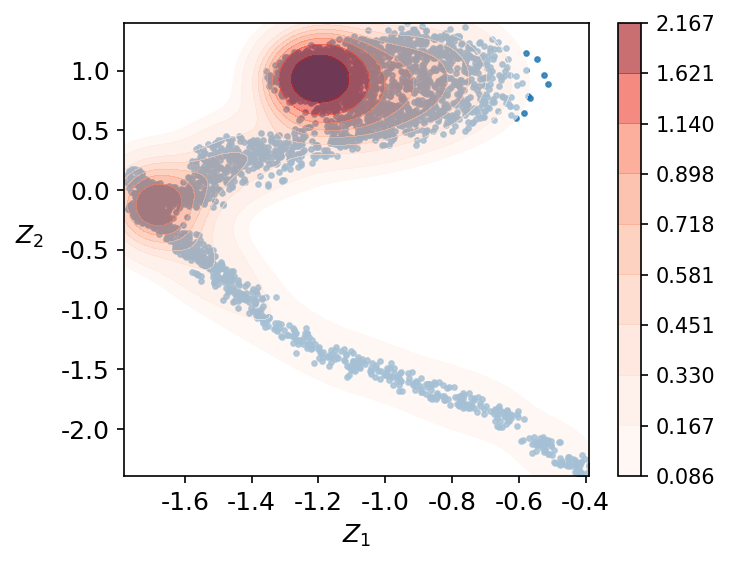

In [ ]:
plt.figure(figsize=(5,4), dpi = 150)
ax = sns.regplot(x=x, y=y, fit_reg = False, scatter_kws={"s": 5})
ax = sns.kdeplot(x=x, y=y, cmap="Reds", shade=True, thresh = 0.05, cut = 0, alpha = 0.6, cbar = True)
ax.set_xlabel(xlabel = '$Z_1$', fontdict={'fontsize' : 12})
ax.set_ylabel(ylabel = '$Z_2$', fontdict={'fontsize' : 12}, rotation = 0, labelpad = 15)
ax.set_xticklabels(np.round(ax.get_xticks(), decimals=2), size = 12)
ax.set_yticklabels(np.round(ax.get_yticks(), decimals=2), size = 12)
ax.figure.axes[-1].yaxis.label.set_size(4)

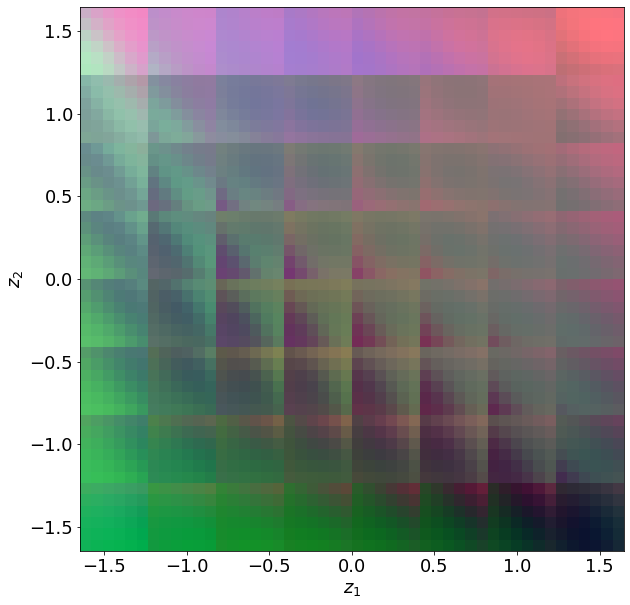

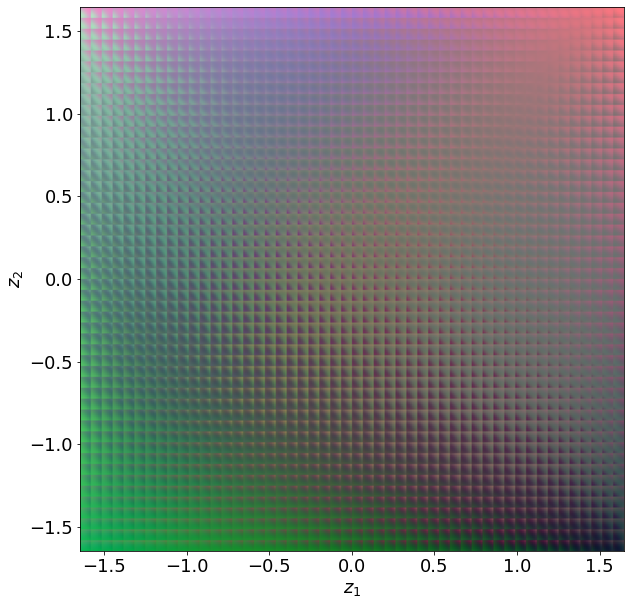

In [ ]:
manifold1 = rvae.manifold2d(d=8);
manifold2 = rvae.manifold2d(d=50);

In [ ]:
rvae.manifold2d(d=50);

[Text(0, 0.5, ''), Text(0, 0.5, '')]

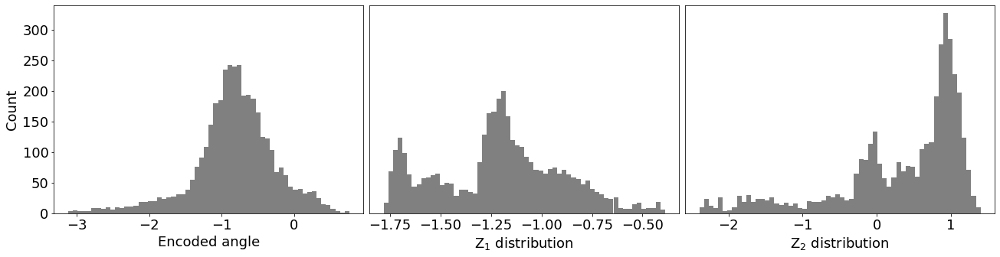

In [ ]:

fig = plt.figure(figsize=(22,5))
gs = gridspec.GridSpec(1,3, wspace = 0.02)
ax1,ax2,ax3 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2])

ax1.hist(z_mean[:,0], bins=60, color='gray')
ax2.hist(z_mean[:, 1], bins=60, color='gray')
ax3.hist(z_mean[:, 2], bins=60, color='gray')
ax1.set_xlabel("Encoded angle", fontsize=18)
ax2.set_xlabel("Z$_1$ distribution", fontsize=18)
ax3.set_xlabel("Z$_2$ distribution", fontsize=18)
for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=18)
    _ax.tick_params(labelsize=18)
    _ax.set_ylim(0,340)
plt.subplots_adjust(wspace=0.3)

plt.setp([ax2,ax3], yticks=[], ylabel = '')

[]

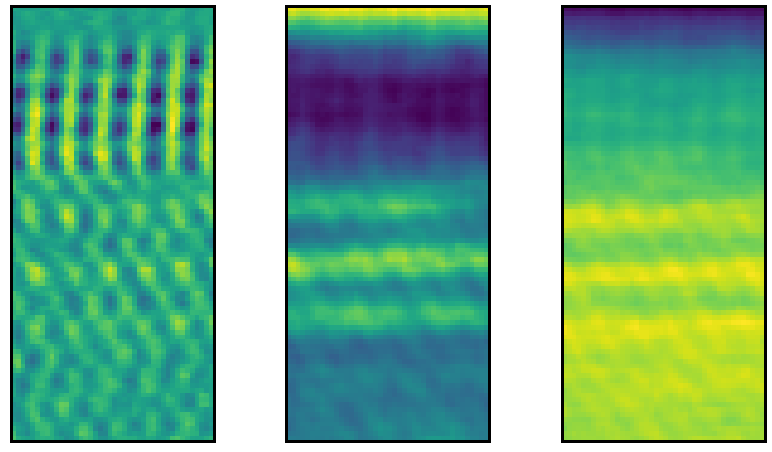

In [ ]:
colormap = 'viridis'

_, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(14,8))

AngleImage = z_mean[:,0].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage1 = z_mean[:,1].reshape(int(d1 - x_window_size),int(d2 - y_window_size))
LatentImage2 = z_mean[:,2].reshape(int(d1 - x_window_size),int(d2 - y_window_size))

ax0.imshow(AngleImage)
ax1.imshow(LatentImage1)
ax2.imshow(LatentImage2)

axes = [ax0,ax1,ax2]
for ax in axes:
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.setp(axes,xticks=[],yticks=[])

* DECODE to see reconstruction performance
* Note: There is no original "encoded angle" (which is the first object in z_mean), so we only use the latent features themselves not the encoded angle, hence, z_mean[:,1:] and not the full z_mean

In [ ]:
decoded_arr = rvae.decode(z_mean[:,1:])  
decoded_arr.shape, feature_arr.shape

((3780, 6, 6, 3), (3780, 6, 6, 3))

Reconstruct each layer and compare to original layer

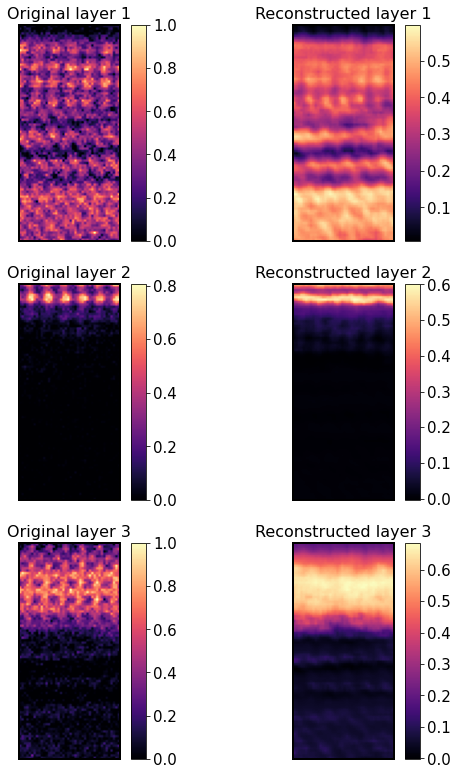

In [ ]:
Origs, Recons = ReconstructCookies(decoded_arr, feature_arr, work_array, average = False)
colormap = Blackbody
colormap = 'magma'

f,ax=plt.subplots(LAYERS,2,figsize=(9,4.5*LAYERS))
if LAYERS > 1:
  for k in range(LAYERS):
    im0 = ax[k,0].imshow(Origs[k], cmap = colormap)
    im1 = ax[k,1].imshow(Recons[k], cmap = colormap)
    ax[k,0].set_title("Original layer {}".format(k+1), fontsize = 16)
    ax[k,1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
    
    cb0 = plt.colorbar(im0, ax=ax[k,0],fraction = 0.1, pad = 0.05, aspect = 14)
    cb1 = plt.colorbar(im1, ax=ax[k,1],fraction = 0.1, pad = 0.05, aspect = 14)
    cb0.ax.tick_params(labelsize=15)
    cb1.ax.tick_params(labelsize=15)
    plt.setp([ax[k,0],ax[k,1]], xticks=[], yticks=[])
    for axis in ['top','bottom','left','right']:
      ax[k,0].spines[axis].set_linewidth(2)
      ax[k,1].spines[axis].set_linewidth(2)
else:
  for k in range(LAYERS):
    im0 = ax[0].imshow(Origs[k], cmap = colormap)
    im1 = ax[1].imshow(Recons[k], cmap = colormap)
    ax[0].set_title("Original layer {}".format(k+1), fontsize = 16)
    ax[1].set_title("Reconstructed layer {}".format(k+1), fontsize = 16)
    cb0 = plt.colorbar(im0, ax=ax[0],fraction = 0.1, pad = 0.05, aspect = 14)
    cb1 = plt.colorbar(im1, ax=ax[1],fraction = 0.1, pad = 0.05, aspect = 14)
    cb0.ax.tick_params(labelsize=15)
    cb1.ax.tick_params(labelsize=15)
    plt.setp([ax[0],ax[1]], xticks=[], yticks=[])
    for axis in ['top','bottom','left','right']:
      ax[0].spines[axis].set_linewidth(2)
      ax[1].spines[axis].set_linewidth(2)